In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


# Import scripts

In [4]:
path_scripts = '/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/'

In [5]:
import sys
sys.path.append(path_scripts)

In [6]:
from ipyparallel import Client
import csv
import os
import pickle
import scipy.io
import scanpy as sc
import anndata
import bbknn
import statsmodels.api as sm
import gseapy as gp
import phenograph as pg
import ternary

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numba/core/cpu.py:77: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [7]:
%R library(Seurat)
%R library(SingleCellExperiment)
%R library(scran)
%R library(DropletUtils)
%R library(DESeq2)

R[write to console]: Loading required package: SummarizedExperiment

R[write to console]: Loading required package: GenomicRanges

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted

array(['DESeq2', 'DropletUtils', 'scran', 'SingleCellExperiment',
       'SummarizedExperiment', 'DelayedArray', 'BiocParallel',
       'matrixStats', 'Biobase', 'GenomicRanges', 'GenomeInfoDb',
       'IRanges', 'S4Vectors', 'BiocGenerics', 'parallel', 'stats4',
       'Seurat', 'tools', 'stats', 'graphics', 'grDevices', 'utils',
       'datasets', 'methods', 'base'], dtype='<U20')

In [8]:
from TenX_PDAC_misc_scripts_v1_0 import *
from TenX_PDAC_plot_v1_0 import *
from TenX_PDAC_mann_whitney_u_v1_0 import *

In [9]:
#exp_id = create_ID()

In [10]:
exp_id = '202110251102'
path_input = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_input/'
path_output = '/Users/simjoo/Projects/10X_PDAC_Lgr5/data_output/v3/'
path_figures = '/Users/simjoo/Projects/10X_PDAC_Lgr5/figures/v3/'

In [11]:
cmap_tab20 = {str(c) : mpl.colors.rgb2hex(plt.cm.tab20(c/20)) for c in range(20)}
cmap_tumor = {'autochthonous':'#d95f02', 'fragment_transplant':'#1b9e77', 'sorted_transplant':'#7570b3',
              '2D':'#e7298a','3D_2%':'#66a61e','3D_Tuv':'#e6ab02',}
cmap_treatment = {'3d_TAM':'#addd8e','10d_Veh':'#31a354','20d_TAM':'#006837',
                  '10d_LGK':'#fd8d3c','20d_LGK':'#bd0026','10d_Gem':'#2c7fb8'}
cmap_lineage_tracing = {'tdTomato': '#d95f02', 'Negative': 'silver', 'tdTomato-GFP': '#e6ab02', 'GFP': '#66a61e'}
cmap_cl_tumor = {'Luminal cells':'#7570b3',
               'Basal cells':'#1b9e77',
               'Mesenchymal cells':'#d95f02'}

# Initialize engines

In [12]:
c = Client()

TimeoutError: Hub connection request timed out

In [ ]:
dview = c[:]

In [ ]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_PDAC_Lgr5/scripts/v3/")')
dview.execute('from TenX_PDAC_misc_scripts_v1_0 import *')
dview.execute('from TenX_PDAC_plot_v1_0 import *')
dview.execute('from TenX_PDAC_mann_whitney_u_v1_0 import *')

# Comparison of 2d and 3d cell lines

In [15]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [16]:
X.X = X.layers['norm_log2']

In [17]:
Xs = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

In [18]:
cmap_tumor = {g:mpl.colors.rgb2hex(plt.cm.tab20(i/20)) for i, g in enumerate(return_unique(Xs.obs['tumor']))}

## Select batch '2D_3D_Cells'

In [28]:
c_sel = Xs.obs['batch'][Xs.obs['batch']=='2D_3D_Cells'].index

In [29]:
len(c_sel)

5599

In [30]:
Xs = Xs[c_sel]

In [31]:
Xs.obs['mouse'] = X.obs['mouse'][Xs.obs_names]

Trying to set attribute `.obs` of view, copying.


## k-nearest neighbors

In [32]:
sc.pp.neighbors(Xs, n_neighbors=25, use_rep='X_nmf', metric='euclidean')

## UMAP

In [33]:
sc.tl.umap(Xs, min_dist=1, spread=3)

In [34]:
Xs.obsm['X_umap_noreg'] = Xs.obsm['X_umap']

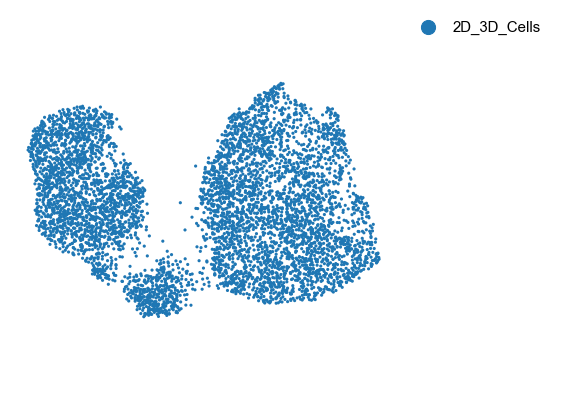

In [67]:
draw_scatter_groups(Xs.obsm['X_umap_noreg'], 
                    Xs.obs['batch'], 
                    s=10, show_axes = False)

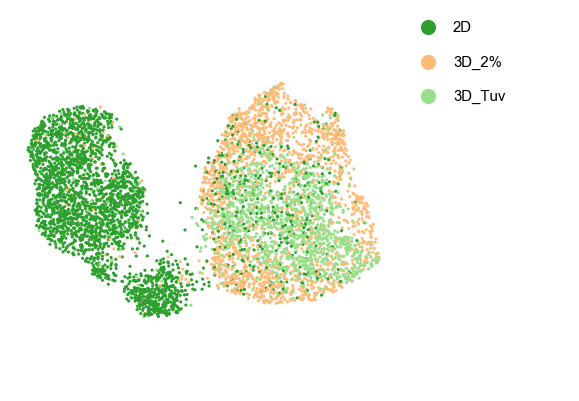

In [68]:
draw_scatter_groups(Xs.obsm['X_umap_noreg'], 
                    Xs.obs['tumor'],
                    cmap_tumor,
                    s=10, show_axes = False)

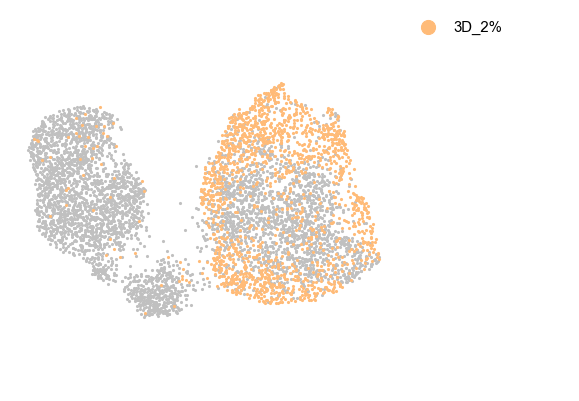

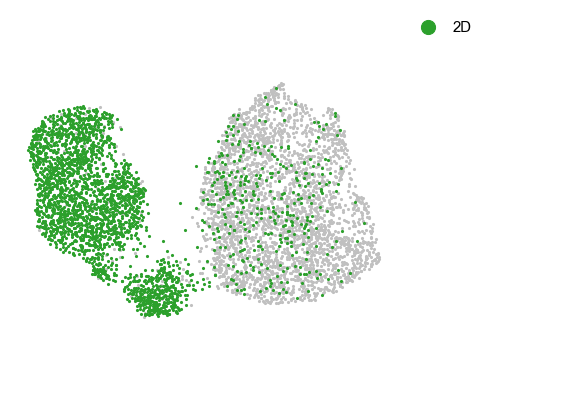

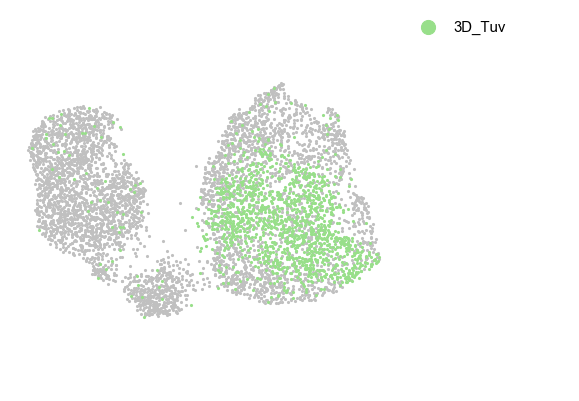

In [69]:
draw_scatter_groups_individual(Xs.obsm['X_umap_noreg'], 
                    Xs.obs['tumor'],
                    cmap=cmap_tumor,
                    s=10, show_axes = False)

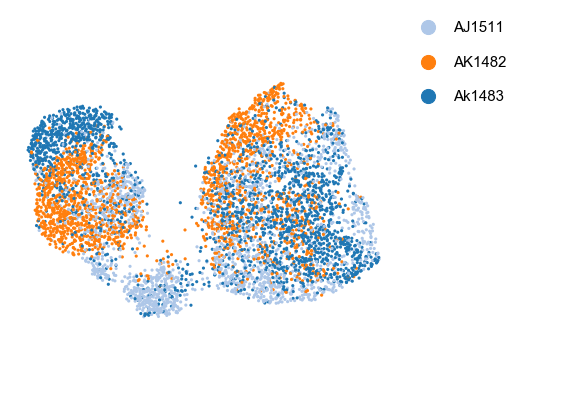

In [70]:
draw_scatter_groups(Xs.obsm['X_umap_noreg'], 
                    Xs.obs['mouse'], 
                    s=10, show_axes = False)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


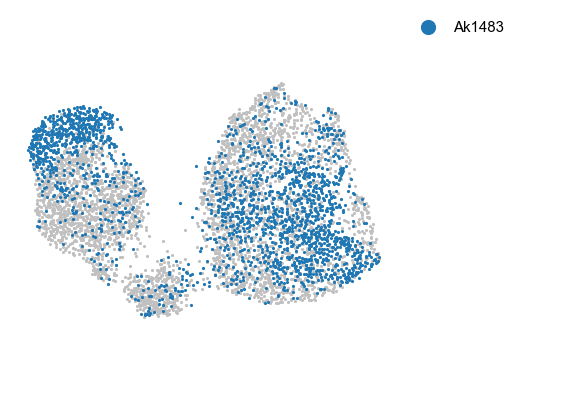

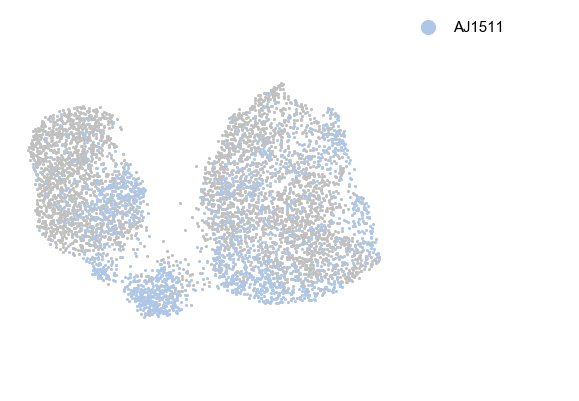

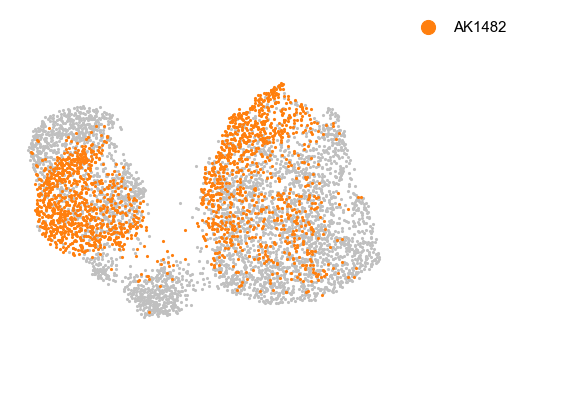

In [71]:
draw_scatter_groups_individual(Xs.obsm['X_umap_noreg'], 
                               Xs.obs['mouse'], 
                               s=10, show_axes = False)

## k-nearest neighbors

In [40]:
bbknn.bbknn(Xs, batch_key='mouse', use_rep='X_nmf', neighbors_within_batch=10, metric='euclidean')

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:294: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/bbknn/__init__.py:295: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


## UMAP

In [41]:
sc.tl.umap(Xs, min_dist=1, spread=3)

In [42]:
Xs.obsm['X_umap_bbknn'] = Xs.obsm['X_umap']

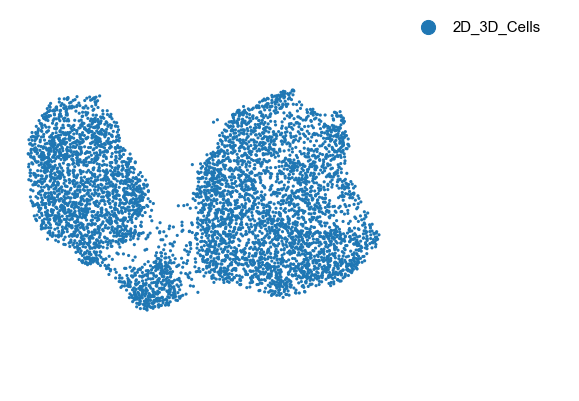

In [72]:
draw_scatter_groups(Xs.obsm['X_umap_bbknn'], 
                    Xs.obs['batch'], 
                    s=10, show_axes = False)

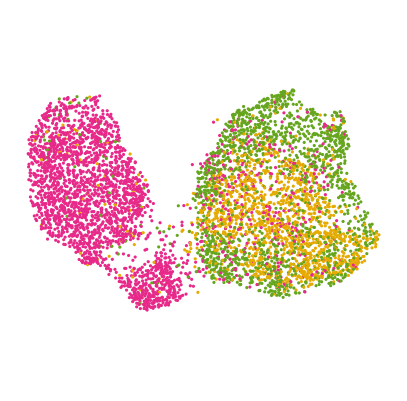

In [117]:
draw_scatter_groups(Xs.obsm['X_umap_bbknn'], 
                    Xs.obs['tumor'],
                    cmap_tumor,
                    s=10, show_axes = False, show_legend=False)

figname = 'UMAP_2d3d.pdf' 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

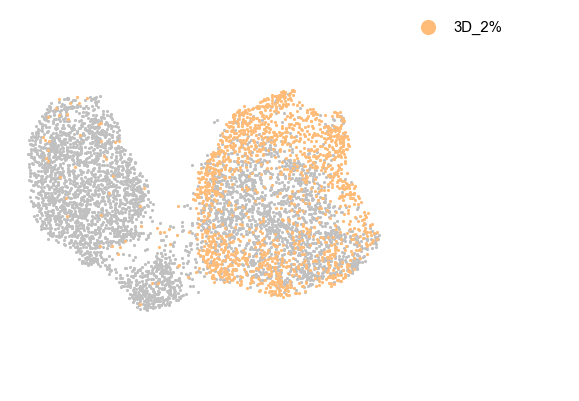

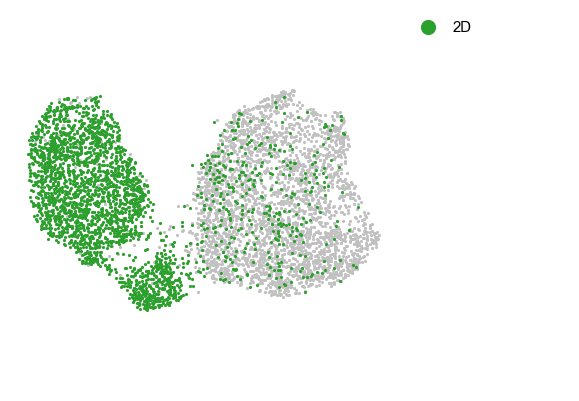

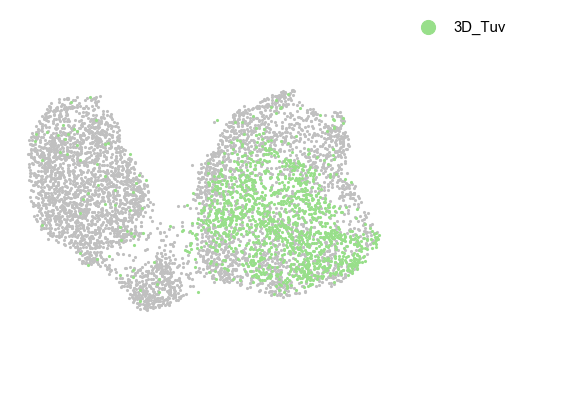

In [74]:
draw_scatter_groups_individual(Xs.obsm['X_umap_bbknn'], 
                    Xs.obs['tumor'],
                    cmap=cmap_tumor,
                    s=10, show_axes = False)

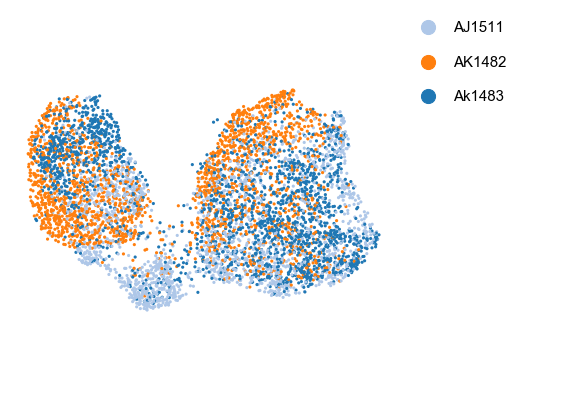

In [75]:
draw_scatter_groups(Xs.obsm['X_umap_bbknn'], 
                    Xs.obs['mouse'], 
                    s=10, show_axes = False)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


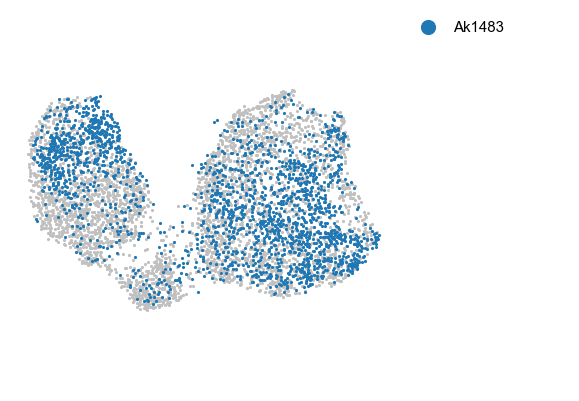

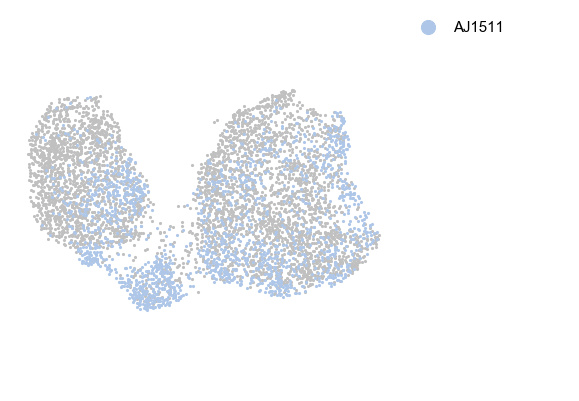

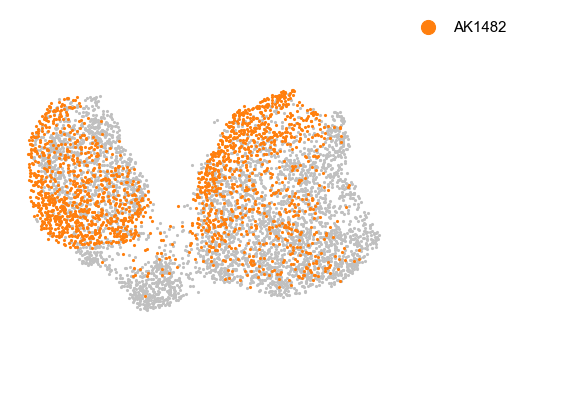

In [76]:
draw_scatter_groups_individual(Xs.obsm['X_umap_bbknn'], 
                               Xs.obs['mouse'],
                               s=10, show_axes = False)

## Marker genes

In [118]:
pdX = sc2pd(X, 'norm_log2')

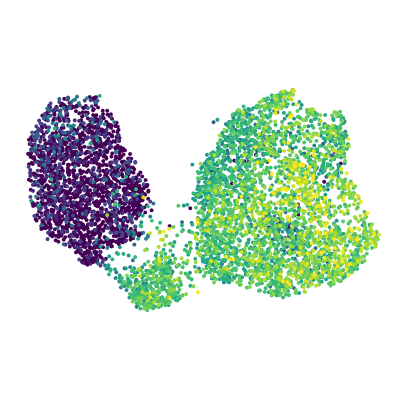

In [119]:
g = 'Epcam'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)

figname = 'UMAP_2d3d_%s.pdf' % g 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

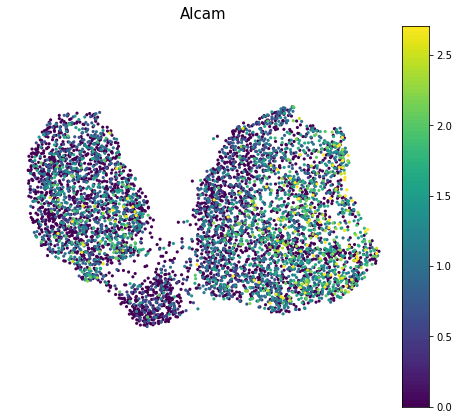

In [50]:
g = 'Alcam'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

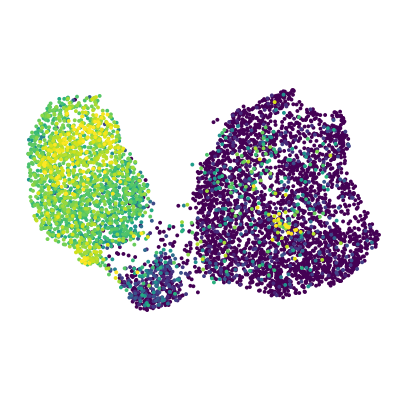

In [120]:
g = 'Vim'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)

figname = 'UMAP_2d3d_%s.pdf' % g 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

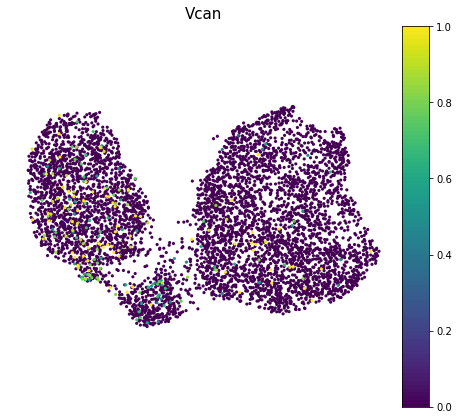

In [23]:
g = 'Vcan'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

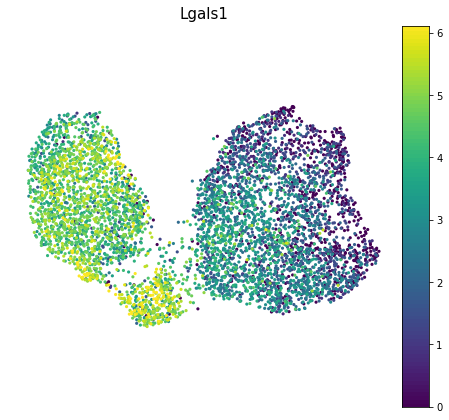

In [53]:
g = 'Lgals1'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

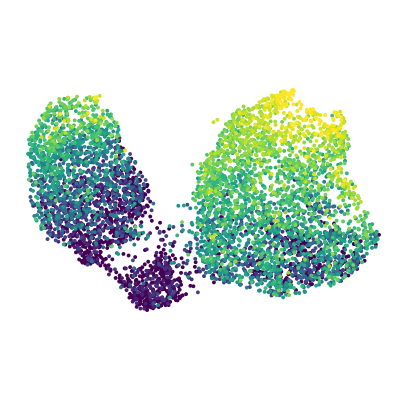

In [121]:
g = 'Lgals4'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)

figname = 'UMAP_2d3d_%s.pdf' % g 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

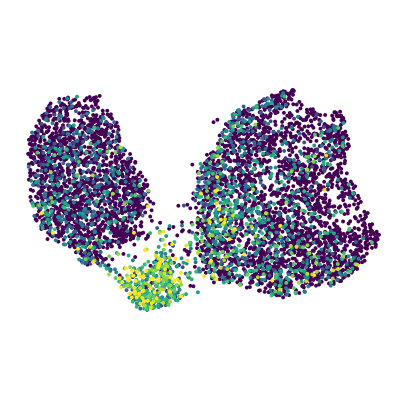

In [122]:
g = 'Cldn6'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = '',
                  s = 15, show_axes=False, show_legend=False)

figname = 'UMAP_2d3d_%s.pdf' % g 
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

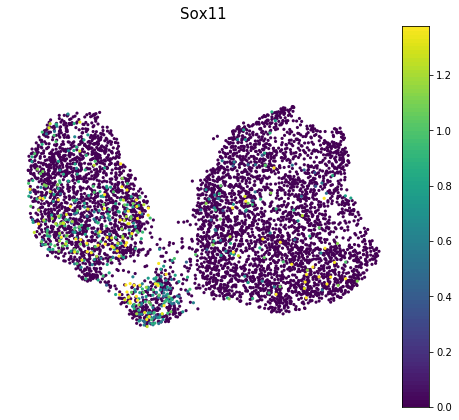

In [56]:
g = 'Sox11'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

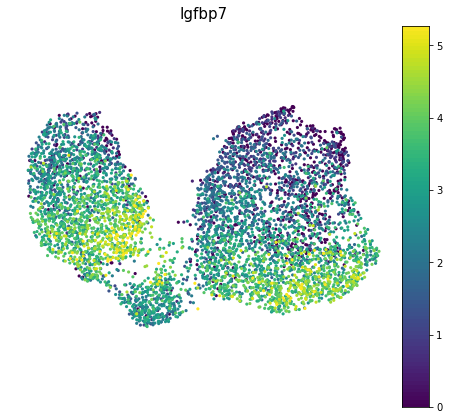

In [57]:
g = 'Igfbp7'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

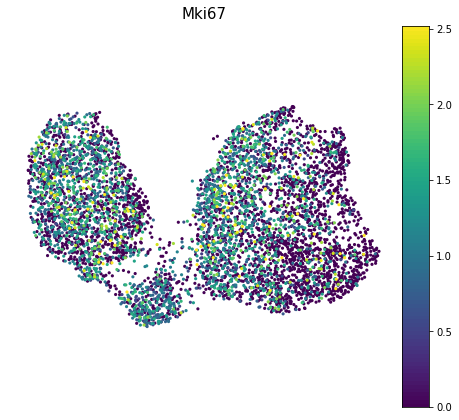

In [58]:
g = 'Mki67'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

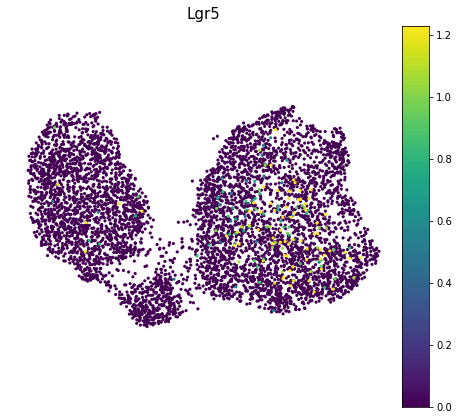

In [59]:
g = 'Lgr5'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

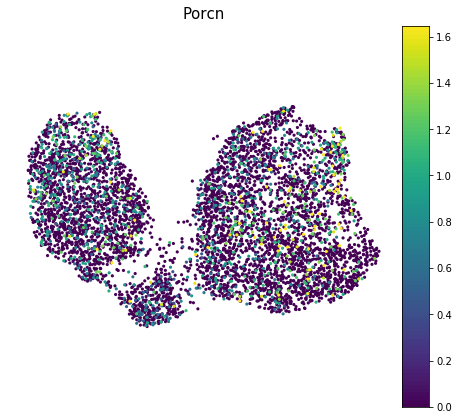

In [60]:
g = 'Porcn'
expr = pdX.loc[g, Xs.obs_names]
draw_scatter_expr(Xs.obsm['X_umap_bbknn'],
                  expr,
                  np.percentile(expr, 1),
                  np.percentile(expr, 99),
                  text = g,
                  s = 10, show_axes=False)

## Phenotypic volume

In [22]:
def sample_phenotypic_volume(dat, grps, n_it, dview, sample=1000, replace=True):
    
    ####################
    
    def get_phenotypic_volume(dat):
    
        cov = np.cov(dat)
        eigval = np.linalg.eig(cov)[0]
        phenovolume = np.sum(np.log(eigval[~np.isclose(eigval,0)]))

        return phenovolume
    
    ####################
    
    out = pd.DataFrame(index=return_unique(grps), 
                       columns=range(n_it))
    
    for g in return_unique(grps):
        c_gr = grps[grps==g].index
        
        for i in range(n_it):
            c_it = np.random.choice(c_gr, size=sample, replace=replace)
        
            out.loc[g, i] = get_phenotypic_volume(dat[c_it])
        
    return out

In [23]:
pdX = sc2pd(Xs, 'norm_log2')

In [24]:
Xs.obs['mouse_pop'] = pd.Series(['%s_%s' % (Xs.obs['mouse'][i], Xs.obs['tumor'][i]) for i in Xs.obs_names],
                      index = Xs.obs_names)

Trying to set attribute `.obs` of view, copying.


In [25]:
mouse_pop_sel = [m for m in set(Xs.obs['mouse_pop']) if Counter(Xs.obs['mouse_pop'])[m]>=250]

In [26]:
len(mouse_pop_sel)

75

In [27]:
c_sel = Xs.obs['mouse_pop'][Xs.obs['mouse_pop'].isin(mouse_pop_sel)].index

In [28]:
Xs = Xs[c_sel]

In [29]:
pv_tumor_mouse = sample_phenotypic_volume(pdX, Xs.obs['mouse_pop'], 10, dview, sample=200, replace=False)

In [30]:
gr_order_tumor = []

for gr in ['autochthonous','2D','3D_2%','3D_Tuv','NSG_2D','F1_2D','NSG_3D','F1_3D','NSG_unsorted','NSG_TdTom-sorted','NSG_fragment']:
    gr_order_tumor += list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))

In [35]:
gr_sel = ['autochthonous','2D','3D_2%','3D_Tuv','NSG_2D','NSG_3D','NSG_unsorted','NSG_TdTom-sorted','NSG_fragment']

In [36]:
gr_order_tumor = []

for gr in gr_sel:
    gr_order_tumor += list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))

In [101]:
cmap_tumor_sel = {'autochthonous':'#e31a1c',
                  '2D':'#b2df8a',
                  '3D_2%':'#a6cee3',
                  '3D_Tuv':'#a6cee3',
                  'NSG_2D':'#33a02c',
                  'NSG_3D':'#1f78b4',
                  'NSG_unsorted':'#ff7f00',
                  'NSG_TdTom-sorted':'#6a3d9a',
                  'NSG_fragment':'#a65628'}

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


[Text(0, 0, 'AN1187_autochthonous'),
 Text(0, 0, 'KW1710_autochthonous'),
 Text(0, 0, 'AN1185_autochthonous'),
 Text(0, 0, 'KW1718_autochthonous'),
 Text(0, 0, 'AK1482_autochthonous'),
 Text(0, 0, 'GH2807_autochthonous'),
 Text(0, 0, 'XZ1386_autochthonous'),
 Text(0, 0, 'AO1235_autochthonous'),
 Text(0, 0, 'AO1213_autochthonous'),
 Text(0, 0, 'GH2798_autochthonous'),
 Text(0, 0, 'KW1714_autochthonous'),
 Text(0, 0, 'AN1928_autochthonous'),
 Text(0, 0, 'AJ1511_2D'),
 Text(0, 0, 'Ak1483_2D'),
 Text(0, 0, 'AK1482_2D'),
 Text(0, 0, 'Ak1483_3D_2%'),
 Text(0, 0, 'AJ1511_3D_2%'),
 Text(0, 0, 'AK1482_3D_2%'),
 Text(0, 0, 'AK1482_3D_Tuv'),
 Text(0, 0, 'Ak1483_3D_Tuv'),
 Text(0, 0, 'AK1697_NSG_2D'),
 Text(0, 0, 'AK1694_NSG_2D'),
 Text(0, 0, 'AK1755_NSG_2D'),
 Text(0, 0, 'AK1698_NSG_2D'),
 Text(0, 0, 'AK1754_NSG_2D'),
 Text(0, 0, 'JC1139_NSG_3D'),
 Text(0, 0, 'JC1132_NSG_3D'),
 Text(0, 0, 'JC1137_NSG_3D'),
 Text(0, 0, 'JC1140_NSG_3D'),
 Text(0, 0, 'AJ1390_NSG_unsorted'),
 Text(0, 0, 'AJ1394_NSG_u

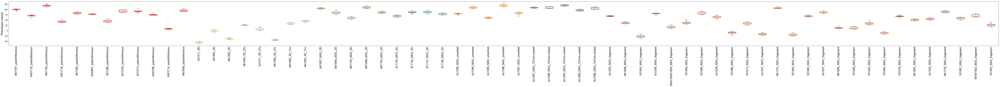

In [39]:
dat = pv_tumor_mouse
gr_order = gr_order_tumor
clist = [cmap_tumor_sel['_'.join(i.split('_')[1:])] for i in gr_order]

L = len(gr_order)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

ax.set_ylabel('Phenotypic volume', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data
    
box = ax.boxplot(x=[dat.loc[i] for i in gr_order], positions = range(L))

for p,b in enumerate(box['boxes']):
            b.set_c(clist[p])
            b.set_lw(3)

ax.set_xticklabels(gr_order, family = 'Arial', fontsize = 20, rotation = 'vertical', )

In [40]:
dat_tumor_mouse = pd.DataFrame(columns = ['vals','mean','std'],
                                        index = gr_sel)

for gr in dat_tumor_mouse.index:
    c_tmp = Xs.obs['tumor'][Xs.obs['tumor']==gr].index
    m_tmp = list(set(Xs.obs['mouse_pop'][c_tmp]))
    dat_tmp = pv_tumor_mouse.loc[m_tmp].mean(axis=1)
    dat_tumor_mouse.loc[gr,'vals'] = dat_tmp.values
    dat_tumor_mouse.loc[gr,'mean'] = dat_tmp.mean()
    dat_tumor_mouse.loc[gr,'std'] = dat_tmp.std()

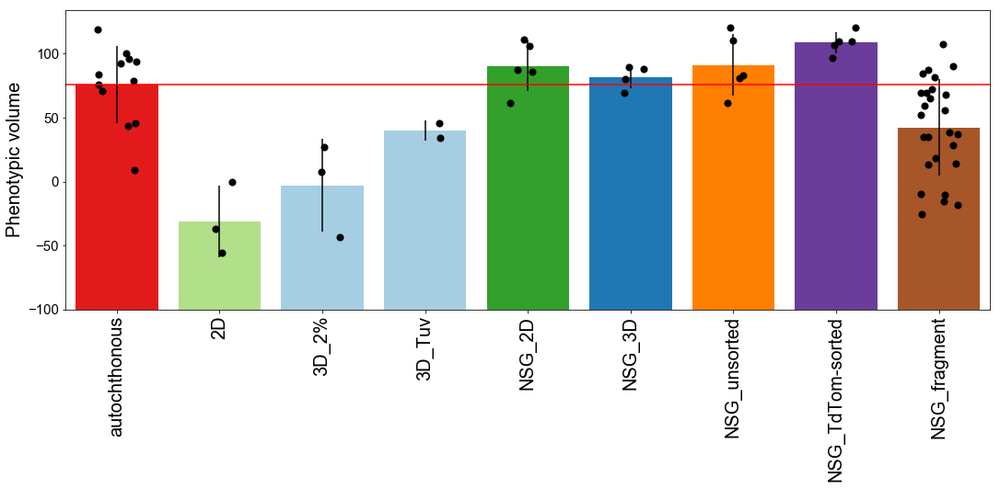

In [43]:
dat = dat_tumor_mouse

L = len(dat.index)

#initialize figure

height = 6
width = 2 * L

plt.figure(facecolor = 'w', figsize = (width, height))

#define x and y axes

ax = plt.subplot()

ax.set_xlim(-0.5, L-0.5)
ax.set_xticks(range(L))

#ax.set_ylim(200,400)

ax.set_ylabel('Phenotypic volume', family = 'Arial', fontsize = 20)
for tick_pos, tick in enumerate(ax.yaxis.get_major_ticks()):
    ax.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
    ax.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(15)

#plot data

for i, gr in enumerate(dat.index):
    ax.bar(i, 
           height=dat['mean'].loc[gr]+100, 
           bottom=-100, 
           color = cmap_tumor_sel[gr],  
           yerr = dat['std'].loc[gr])
    
for i, gr in enumerate(dat.index):
    
    ax.scatter(i-(np.random.random(len(dat['vals'].loc[gr]))-0.5)*0.4,
               dat['vals'].loc[gr],
               c = 'k',
               s = 50,
               zorder = 2)

ax.set_xticklabels(dat.index, family = 'Arial', fontsize = 20, rotation = 'vertical')
ax.axhline(dat['mean'].loc['autochthonous'], color='r')

## Composition of tumor types

In [152]:
gr_order_tumor = []

for gr in ['autochthonous','2D','3D_2%','3D_Tuv','NSG_2D','F1_2D','NSG_3D','F1_3D','NSG_unsorted','NSG_TdTom-sorted','NSG_fragment']:
    gr_order_tumor += list(set(Xs.obs['mouse_pop'][Xs.obs['tumor']==gr]))

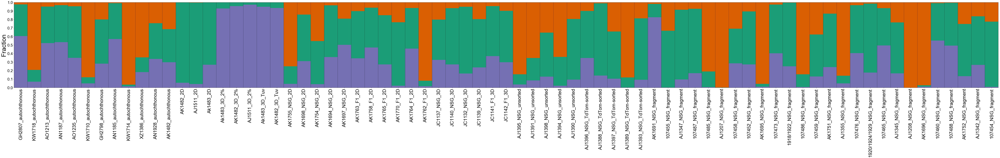

In [162]:
draw_fraction_cluster(Xs.obs['mouse_pop'], 
                      Xs.obs['pheno_class_pca'],
                      {0:'#7570b3',1:'#1b9e77',2:'#d95f02',None:'silver'},
                      var_order=[0,1,2],
                      cl_order=gr_order)

In [154]:
comp_tumor = pd.DataFrame(index=gr_order_tumor, columns = [0,1,2])

for gr in comp_tumor.index:
    c_sel = Xs.obs['mouse_pop'][Xs.obs['mouse_pop']==gr].index
    l = len(c_sel)
    cnt_tmp = Counter(Xs.obs['pheno_class_nmf'][c_sel])
    comp_tumor.loc[gr] = np.array([cnt_tmp[0], cnt_tmp[1], cnt_tmp[2]])/l

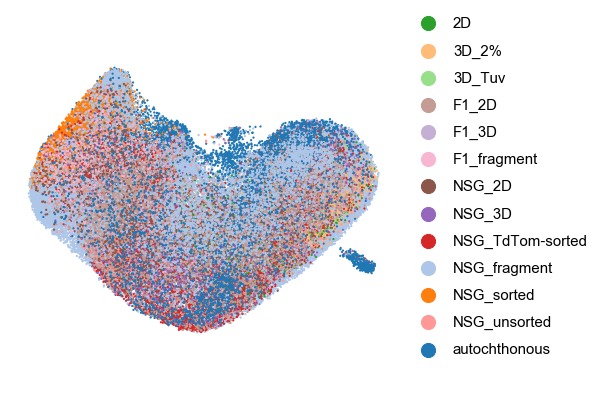

In [161]:
draw_scatter_groups(Xs_[Xs.obs_names].obsm['X_umap_pca'], 
                    Xs_.obs['tumor'][Xs.obs_names],
                    cmap_tumor,
                    s=5, show_axes = False)

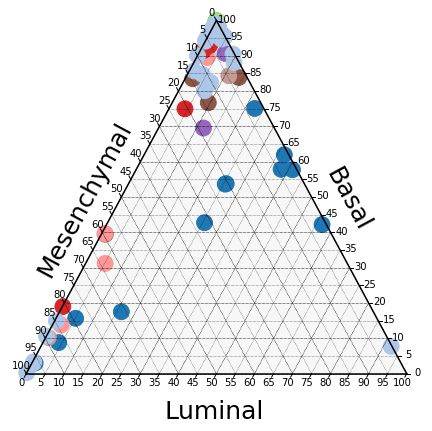

In [156]:
dat = list(zip(comp_tumor[0]*100, 
               comp_tumor[1]*100,
               comp_tumor[2]*100))
cmap = cmap_tumor
clist = [cmap['_'.join(i.split('_')[1:])] for i in comp_tumor.index]

## Boundary and Gridlines
scale = 100
figure, tax = ternary.figure(scale=scale)
figure.set_figheight(7.5)
figure.set_figwidth(7.5)

# Draw Boundary and Gridlines
tax.boundary(linewidth=1.5)
tax.gridlines(color="black", multiple=10)
tax.gridlines(color="black", multiple=5, linewidth=0.5)

# Set Axis labels and Title
fontsize = 25
offset = 0.1
tax.left_axis_label("Mesenchymal", fontsize=fontsize, offset=offset)
tax.right_axis_label("Basal", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Luminal", fontsize=fontsize, offset=0.025)

# Set ticks
tax.ticks(axis='lbr', linewidth=1, multiple=5, offset=0.01)

# Background color
tax.set_background_color(color="whitesmoke", alpha=0.7) # the detault, essentially

# Remove default Matplotlib Axes
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')

#plot scatter

tax.scatter(dat, s=250, color = clist)

## Checkpoint

In [362]:
#Xs.write_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_tumor_type_comp.h5' % (path_output, exp_id))

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'mouse_pop' as categorical


# Transcriptional distance between tumor models

In [19]:
def calculate_transcriptional_distance_selected(dat, groups, selected, n_iter=100, n_sample=50, replace=False, distance='euclidean'):
    
    def get_distance_helper(dat1, dat2, distance='euclidean'):
        
        if distance=='euclidean':
            return scipy.spatial.distance.euclidean(dat1, dat2)
        elif distance=='correlation':
            return scipy.spatial.distance.correlation(dat1, dat2)
    
    #calculate randomly sampled pseudobulk vectors for each group
    
    psb = []
    
    for gr in selected:
        c_sel = groups[groups==gr].index
        psb_gr = pd.DataFrame(index = dat.index, columns = range(n_iter))
        
        for i in range(n_iter):
            c_sel_rand = np.random.choice(c_sel, n_sample, replace=replace)
            psb_gr[i] = dat[c_sel_rand].mean(axis=1)
        psb.append(psb_gr)
        
    #calculate pairwise distances between selected groups
    
    dist = pd.Series(index = range(n_iter))
    
    for i in range(n_iter):
        dist.loc[i] = get_distance_helper(psb[0][i], psb[1][i], distance=distance)
        
    return dist

In [68]:
def draw_transcriptional_distance(dat, cmap, group_order=None, axis_label='Distance', ylim=None):
    
    if group_order:
        dat = dat.loc[group_order]
    
    l = len(dat.index)
    clist = [cmap[i] for i in dat.index]
    
    #initialize figure
    
    height = 5
    width = l*1.2
    plt.figure(facecolor = 'w', figsize = (width, height))
    
    #define axis
    
    ax = plt.subplot(111)
    
    ax.set_xlim(l-0.5, -0.5)
    
    #plot data
    box = ax.boxplot(x=[dat.loc[i] for i in dat.index], 
                     positions = range(l), 
                     vert=True, notch=True, patch_artist=True, showfliers=False)

    for p,b in enumerate(box['boxes']):
                b.set_facecolor(clist[p])
                b.set_linewidth(0.0)
                
    
    ax.set_xticks(range(l))
    ax.set_xticklabels(dat.index, family = 'Arial', fontsize = 25, rotation='vertical', va='top')
    
    ax.set_ylabel(axis_label, family='Arial', fontsize = 30)
    
    #ax.axhline(1, color = 'k', lw=1)
    
    #plot background bars
    
    for i in range(l):
        if i%2==0:
            ax.axvspan(xmin=i-0.5, xmax=i+0.5, color='#f0f0f0')
            
    if ylim:
        ax.set_ylim(ylim)

In [21]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [22]:
Xs_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))
Xs_fit_on_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

In [23]:
Xs = X[Xs_fit_on_aut.obs_names]
Xs.obs['pheno_class_pca'] = None
Xs.obs['pheno_class_pca'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['pheno_class_pca']

Trying to set attribute `.obs` of view, copying.
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


### Feature selection

In [24]:
g_sel = Xs.var[(Xs.var['mean_counts']>0.1) & (Xs.var['n_cells_by_counts']>(len(Xs.obs_names)*0.1))].index

In [25]:
len(g_sel)

7990

In [26]:
Xs = Xs[:,g_sel]

### Feature selection - VST

In [27]:
pdX = sc2pd(Xs, 'raw')

In [28]:
feat = select_features_vst(pdX, 2500)

In [29]:
Xs = Xs[:,feat]

### Regression of cell cycle

In [30]:
Xs.obs['S_score'], Xs.obs['G2M_score'] = None, None
Xs.obs['S_score'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['S_score']
Xs.obs['G2M_score'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['G2M_score']

Trying to set attribute `.obs` of view, copying.
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

In [31]:
sc.pp.regress_out(Xs, ['S_score', 'G2M_score'])

### Calculate transcriptional distances vs. autochthonous

In [32]:
pdX = sc2pd(Xs, 'norm_log2')

In [33]:
groups_sel = [('autochthonous','autochthonous'),
              ('autochthonous','NSG_unsorted'),
              ('autochthonous','NSG_TdTom-sorted'),
              ('autochthonous','2D'),
              ('autochthonous','3D_Tuv'),
              ('autochthonous','NSG_2D'),
              ('autochthonous','NSG_3D'),
              ('autochthonous','NSG_fragment')]

In [50]:
ndict = {'autochthonous':'autochthonous',
         'NSG_unsorted':'transplant:\nunsorted',
         'NSG_TdTom-sorted':'transplant:\nTdTom-sorted',
         'NSG_2D':'transplant: 2D',
         'NSG_3D':'transplant: 3D',
         'NSG_fragment':'transplant:\nfragment',
         '2D':'culture: 2D','3D_Tuv':'culture: 3D'}

In [51]:
cmap_tumor_sel = {'autochthonous':'#e31a1c',
                  'culture: 2D':'#b2df8a',
                  'culture: 3D':'#a6cee3',
                  'transplant: 2D':'#33a02c',
                  'transplant: 3D':'#1f78b4',
                  'transplant:\nunsorted':'#ff7f00',
                  'transplant:\nTdTom-sorted':'#6a3d9a',
                  'transplant:\nfragment':'#a65628'}

In [55]:
n_iter=1000
dist_luminal = pd.DataFrame(index = [grs[1] for grs in groups_sel], columns = range(n_iter))
c_sel_luminal = Xs.obs[Xs.obs['pheno_class_pca']==0].index

for grs in groups_sel:
    try:
        dist_luminal.loc[grs[1]] = calculate_transcriptional_distance_selected(pdX, 
                                                                                    Xs.obs['tumor'][c_sel_luminal], 
                                                                                    grs, 
                                                                                    n_iter,
                                                                                    n_sample=10, 
                                                                                    replace=False,
                                                                                    distance='euclidean')
    except:
        dist_luminal.loc[grs[1]] = None

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [56]:
dist_luminal.index = [ndict[i] for i in dist_luminal.index]

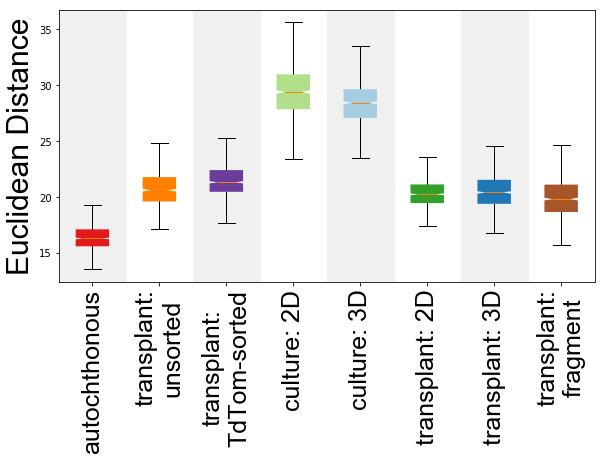

In [69]:
draw_transcriptional_distance(dist_luminal,
                              cmap=cmap_tumor_sel,
                              axis_label='Euclidean Distance')

figname = 'dist_luminal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [58]:
n_iter=1000
dist_basal = pd.DataFrame(index = [grs[1] for grs in groups_sel], columns = range(n_iter))
c_sel_basal = Xs.obs[Xs.obs['pheno_class_pca']==1].index

for grs in groups_sel:
    try:
        dist_basal.loc[grs[1]] = calculate_transcriptional_distance_selected(pdX, 
                                                                                    Xs.obs['tumor'][c_sel_basal], 
                                                                                    grs, 
                                                                                    n_iter,
                                                                                    n_sample=10, 
                                                                                    replace=False,
                                                                                    distance='euclidean')
    except:
        dist_basal.loc[grs[1]] = None

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [59]:
dist_basal.index = [ndict[i] for i in dist_basal.index]

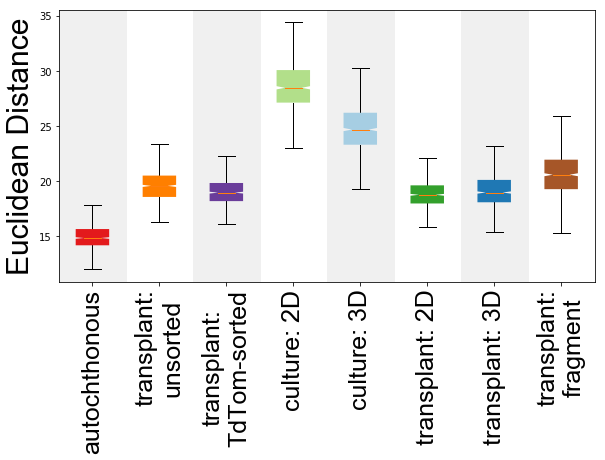

In [70]:
draw_transcriptional_distance(dist_basal,
                              cmap=cmap_tumor_sel,
                              axis_label='Euclidean Distance')

figname = 'dist_basal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [61]:
n_iter=1000
dist_mes = pd.DataFrame(index = [grs[1] for grs in groups_sel], columns = range(n_iter))
c_sel_mes = Xs.obs[Xs.obs['pheno_class_pca']==2].index

for grs in groups_sel:
    try:
        dist_mes.loc[grs[1]] = calculate_transcriptional_distance_selected(pdX, 
                                                                                    Xs.obs['tumor'][c_sel_mes], 
                                                                                    grs, 
                                                                                    n_iter,
                                                                                    n_sample=10, 
                                                                                    replace=False,
                                                                                    distance='euclidean')
    except:
        dist_mes.loc[grs[1]] = 0

/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [62]:
dist_mes.index = [ndict[i] for i in dist_mes.index]

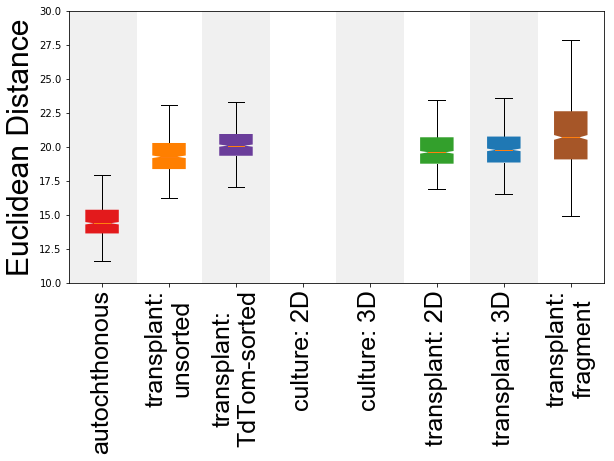

In [71]:
draw_transcriptional_distance(dist_mes,
                              cmap=cmap_tumor_sel,
                              axis_label='Euclidean Distance', ylim=(10,30))

figname = 'dist_mesenchymal.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Differentially expressed genes in tumor transplants

In [12]:
X = sc.read_h5ad('%s/%s_X_PDAC_Lgr5_pp.h5' % (path_output, exp_id))

In [13]:
Xs_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_aut.h5' % (path_output, exp_id))
Xs_fit_on_aut = sc.read_h5ad('%s/%s_Xs_PDAC_Lgr5_tumor_fit_on_aut.h5' % (path_output, exp_id))

In [14]:
Xs = X[Xs_fit_on_aut.obs_names]
Xs.obs['pheno_class_pca'] = None
Xs.obs['pheno_class_pca'][Xs_fit_on_aut.obs_names] = Xs_fit_on_aut.obs['pheno_class_pca']

Trying to set attribute `.obs` of view, copying.
/Users/simjoo/opt/anaconda3/envs/scrnaseq/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [15]:
cmap_tumor_sel = {'autochthonous':'#e31a1c',
                  '2D':'#b2df8a',
                  '3D_2%':'#a6cee3',
                  '3D_Tuv':'#a6cee3',
                  'NSG_2D':'#33a02c',
                  'NSG_3D':'#1f78b4',
                  'NSG_unsorted':'#ff7f00',
                  'NSG_TdTom-sorted':'#6a3d9a',
                  'NSG_fragment':'#a65628'}

In [16]:
cmap_population = {'classical': '#7570b3',
                   'basal': '#1b9e77',
                   'mesenchymal': '#d95f02'}

## Select relevant models

In [17]:
c_sel = Xs.obs[Xs.obs['tumor'].isin(['autochthonous','NSG_unsorted','NSG_TdTom-sorted',
                                     '2D','3D_Tuv','NSG_2D','NSG_3D','NSG_fragment'])].index

In [18]:
len(c_sel)

90379

In [19]:
Xs = Xs[c_sel]

## Filter genes

In [20]:
g_sel = Xs.var[(Xs.var['mean_counts']>0.1) & (Xs.var['n_cells_by_counts']>(len(Xs.obs_names)*0.1))].index

In [21]:
len(g_sel)

8005

In [22]:
Xs = Xs[:,g_sel]

## Create pseudobulk values for each cell state in each tumor / mouse

In [23]:
pdX = sc2pd(Xs, 'raw')

In [24]:
psb = pd.DataFrame(index = pdX.index)
classes = pd.DataFrame(columns=['model','population'])
cmin = 50
ndict = {0:'classical',1:'basal',2:'mesenchymal'}

for gr in set(Xs.obs['tumor']):
    for m in set(Xs.obs['mouse'][Xs.obs['tumor']==gr]):
        for pop in set(Xs.obs['pheno_class_pca']):
            c_sel = Xs.obs[(Xs.obs['mouse']==m)&(Xs.obs['tumor']==gr)&(Xs.obs['pheno_class_pca']==pop)].index
            if len(c_sel) >= cmin:
                psb['%s-%s' % (m,ndict[pop])] = np.ceil(pdX[c_sel].mean(axis=1))
                classes.loc['%s-%s' % (m,ndict[pop])] = [gr, ndict[pop]]

In [393]:
gr_order = []

for t in ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']:
    for p in ['classical','basal','mesenchymal']:
        gr_order += sorted(list(classes[(classes['model']==t)&(classes['population']==p)].index))

In [394]:
classes = classes.loc[gr_order]
psb = psb[gr_order]

# DEGs: NSG_unsorted vs. autochthonous

In [334]:
model = 'NSG_unsorted'

## all cells

In [335]:
classes_sel = classes[classes['model'].isin(['autochthonous',model])]

In [336]:
psb_sel = psb[classes_sel.index]

In [337]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~population+model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [338]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [339]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model)

In [340]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model, 'DataFrame')

## Visualize

In [341]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [342]:
print(len(genes_sel_up), len(genes_sel_down))

182 2


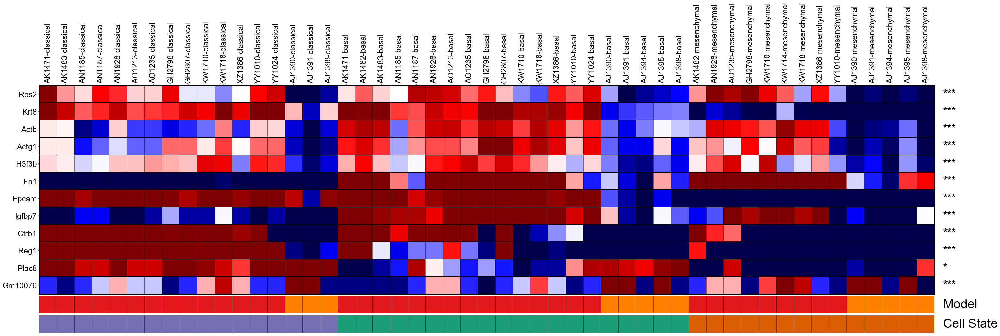

In [344]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_all.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [100]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

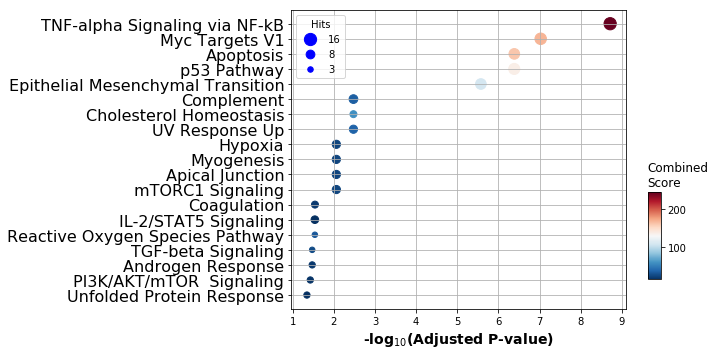

In [101]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [102]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

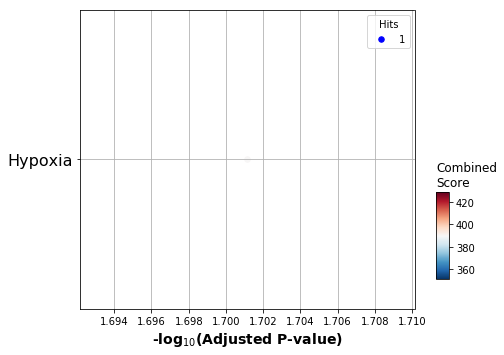

In [103]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Classical cells

In [104]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='classical'))]

In [105]:
psb_sel = psb[classes_sel.index]

In [110]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [111]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [112]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model)

In [113]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model, 'DataFrame')

## Visualize

In [114]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [115]:
print(len(genes_sel_up), len(genes_sel_down))

7 0


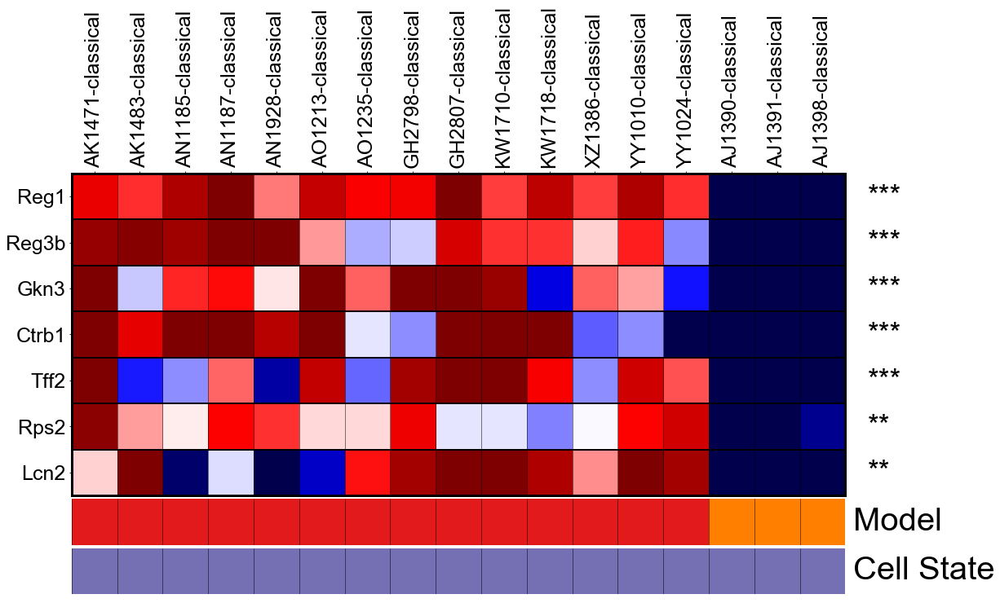

In [116]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_classical.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [117]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [118]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## EnrichR - genes down

In [123]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Basal cells

In [124]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='basal'))]

In [125]:
psb_sel = psb[classes_sel.index]

In [126]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [127]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [128]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model)

In [129]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model, 'DataFrame')

## Visualize

In [130]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [131]:
print(len(genes_sel_up), len(genes_sel_down))

18 1


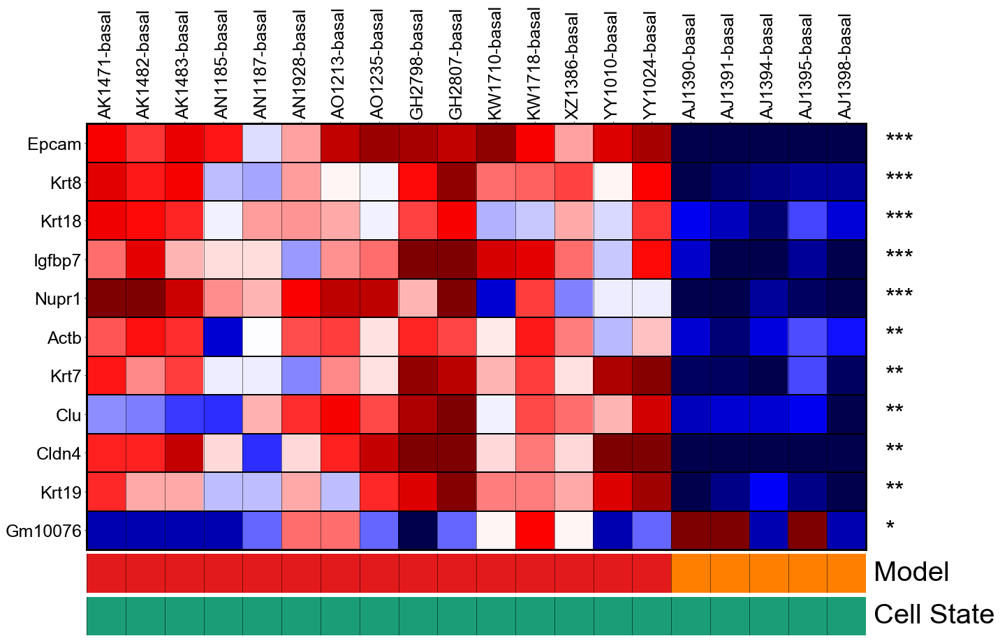

In [132]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_basal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [120]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [121]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## EnrichR - genes down

In [122]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Mesenchymal cells

In [133]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='mesenchymal'))]

In [134]:
psb_sel = psb[classes_sel.index]

In [135]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [136]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [137]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model)

In [138]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model, 'DataFrame')

## Visualize

In [139]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [140]:
print(len(genes_sel_up), len(genes_sel_down))

24 0


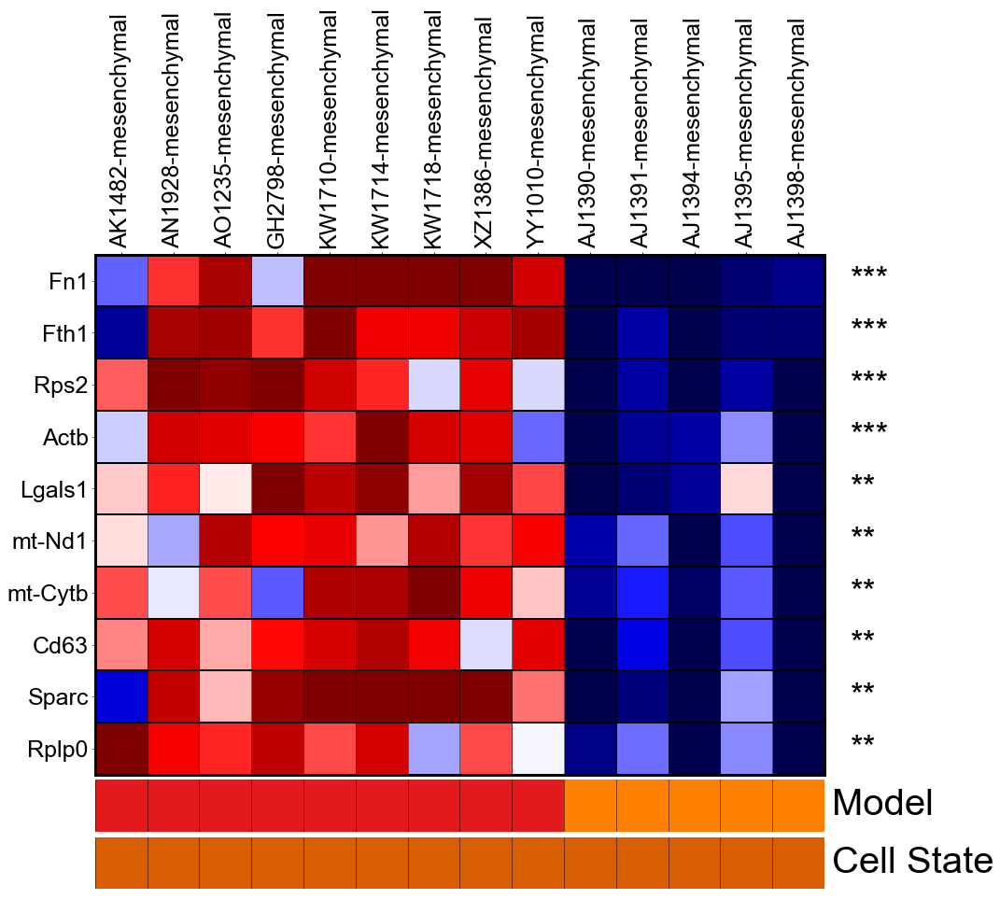

In [141]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_mesenchymal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [126]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

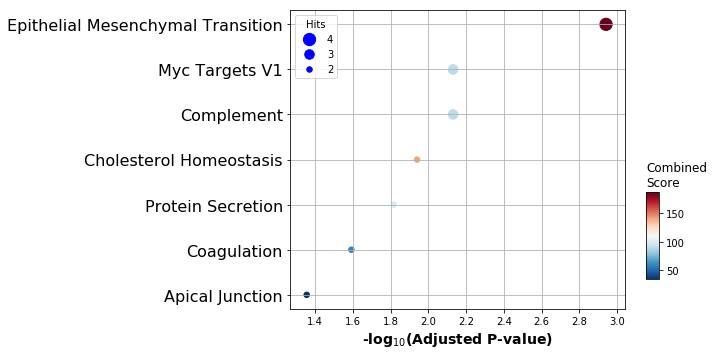

In [127]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [128]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

# DEGs: NSG_TdTom-sorted vs. autochthonous

In [142]:
model = 'NSG_TdTom-sorted'

## all cells

In [143]:
classes_sel = classes[classes['model'].isin(['autochthonous',model])]

In [144]:
psb_sel = psb[classes_sel.index]

In [152]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~population+model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [153]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [154]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model)

In [155]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model, 'DataFrame')

## Visualize

In [156]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [157]:
print(len(genes_sel_up), len(genes_sel_down))

264 2


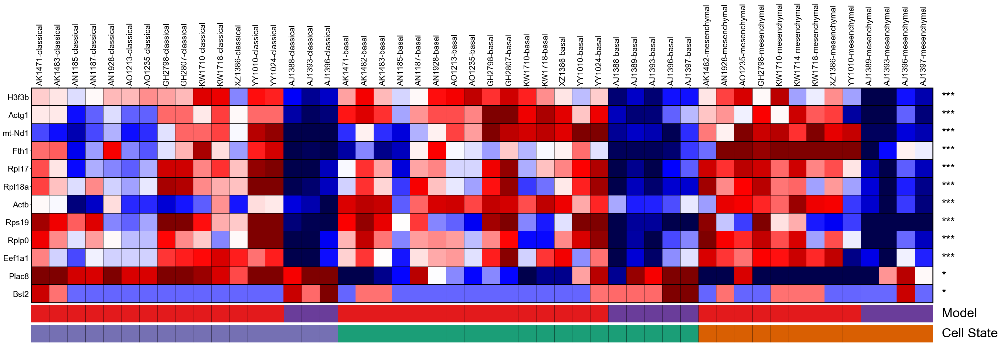

In [158]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_all.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [139]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

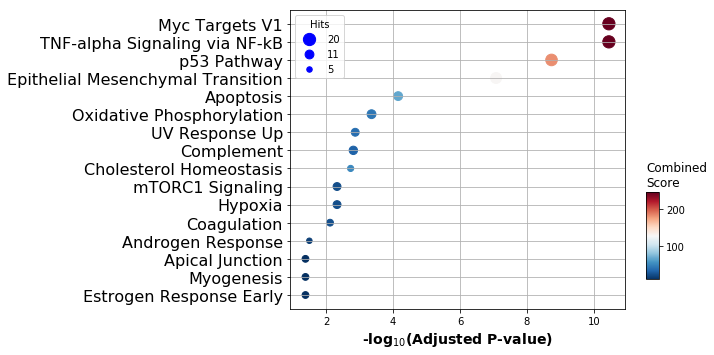

In [140]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [141]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

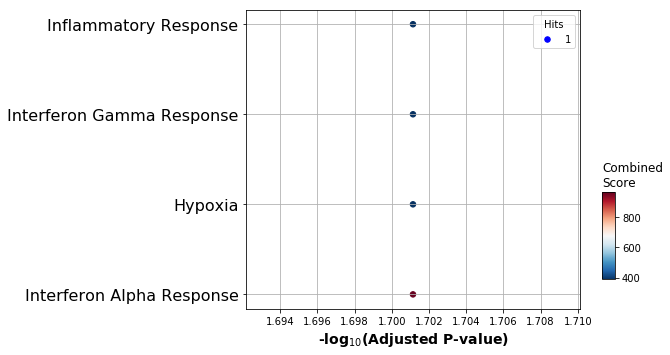

In [142]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Classical cells

In [159]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='classical'))]

In [160]:
psb_sel = psb[classes_sel.index]

In [161]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [162]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [163]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model)

In [164]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model, 'DataFrame')

## Visualize

In [165]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [166]:
print(len(genes_sel_up), len(genes_sel_down))

14 0


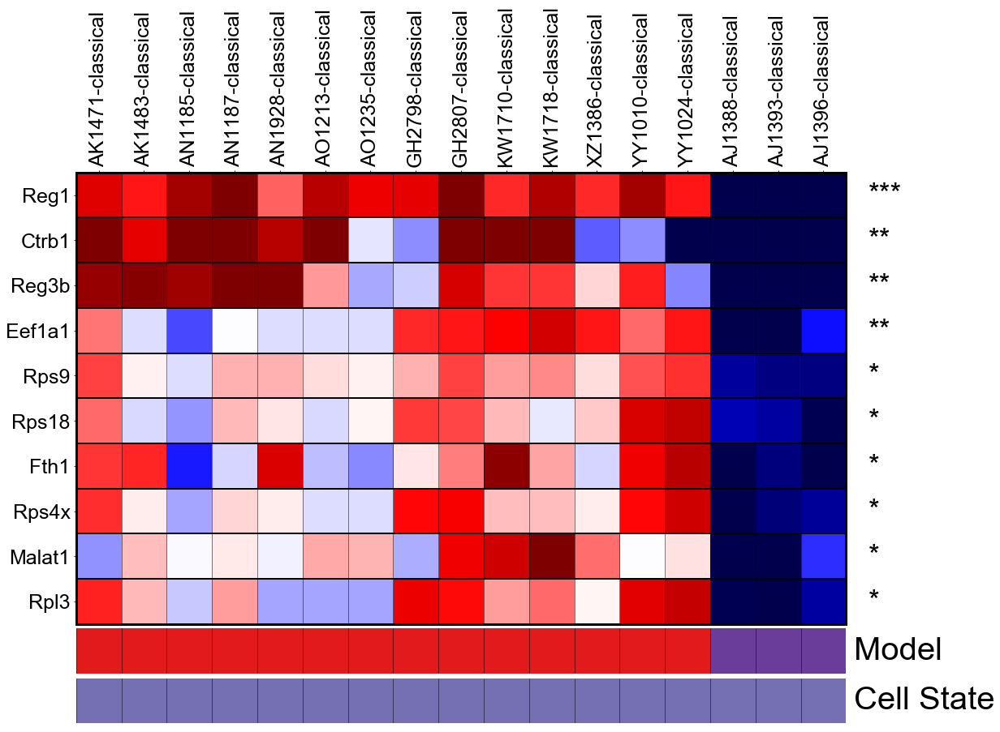

In [167]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_classical.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [152]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

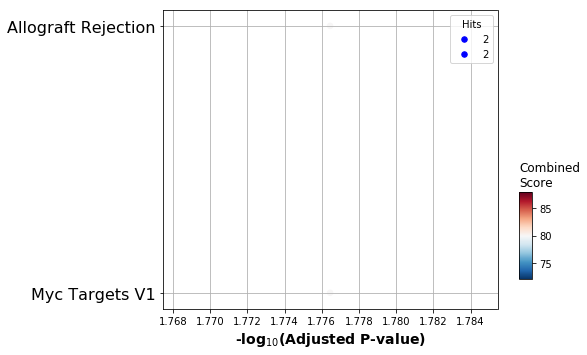

In [153]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [154]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Basal cells

In [168]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='basal'))]

In [169]:
psb_sel = psb[classes_sel.index]

In [170]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [171]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [172]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model)

In [173]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model, 'DataFrame')

## Visualize

In [174]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [175]:
print(len(genes_sel_up), len(genes_sel_down))

19 0


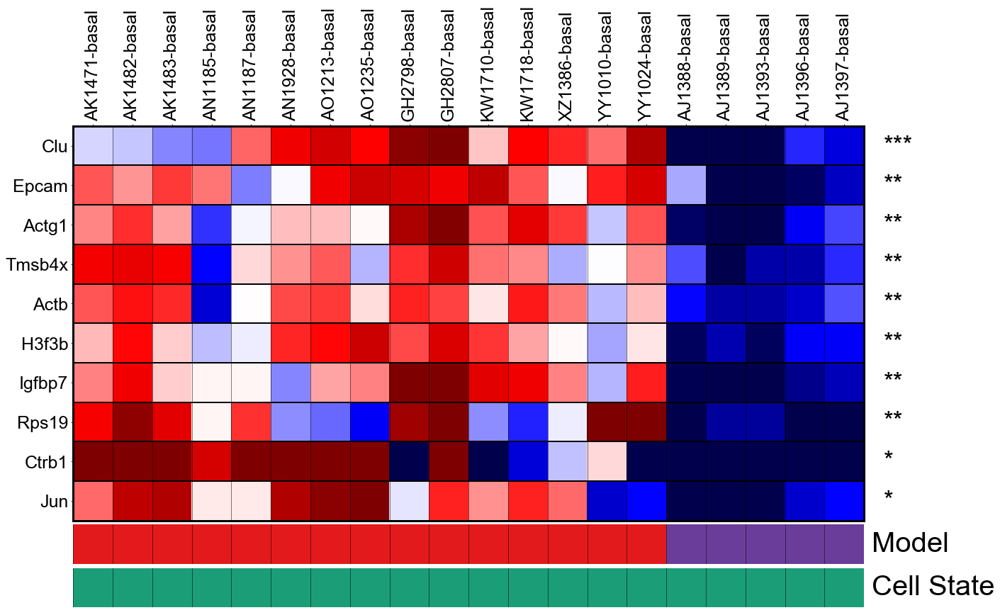

In [176]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_basal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [164]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

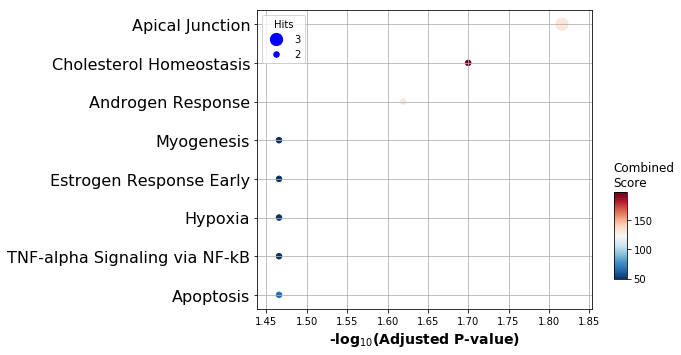

In [165]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [166]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Mesenchymal cells

In [177]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='mesenchymal'))]

In [178]:
psb_sel = psb[classes_sel.index]

In [179]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [180]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [181]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model)

In [182]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model, 'DataFrame')

## Visualize

In [183]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [184]:
print(len(genes_sel_up), len(genes_sel_down))

15 0


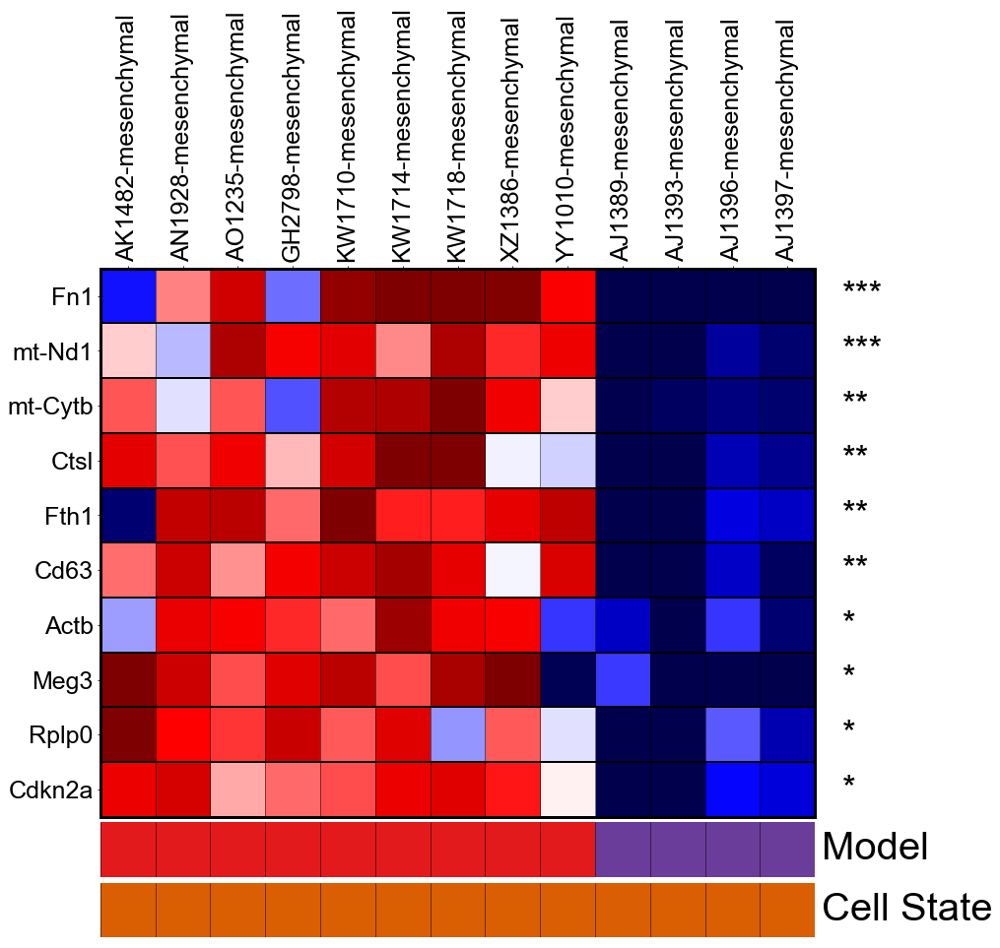

In [185]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_mesenchymal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [181]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

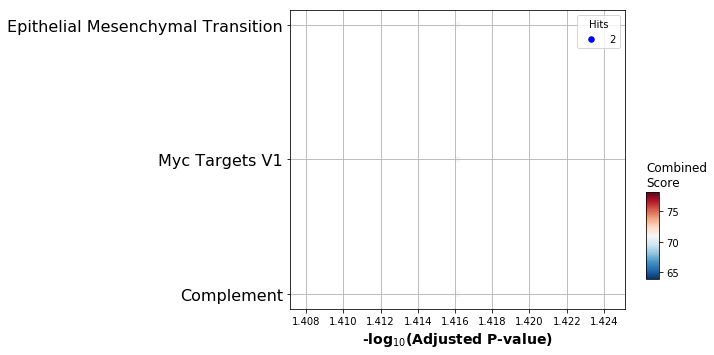

In [182]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [183]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

# DEGs: NSG_2D vs. autochthonous

In [186]:
model = 'NSG_2D'

## all cells

In [187]:
classes_sel = classes[classes['model'].isin(['autochthonous',model])]

In [188]:
psb_sel = psb[classes_sel.index]

In [189]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~population+model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [190]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [191]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model)

In [192]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model, 'DataFrame')

## Visualize

In [193]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [194]:
print(len(genes_sel_up), len(genes_sel_down))

141 2


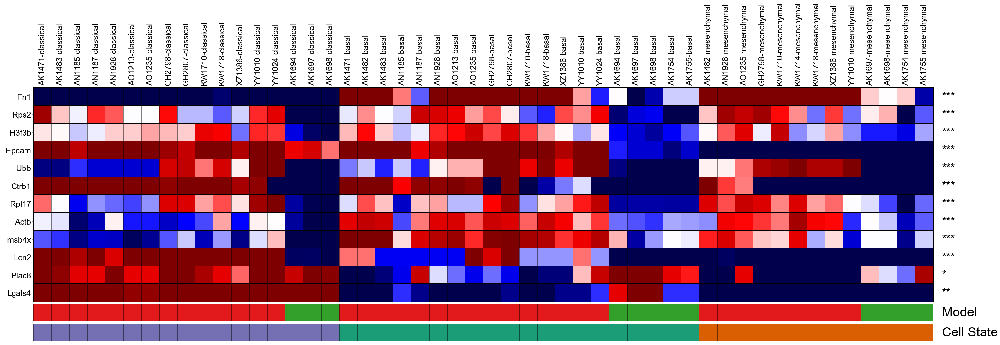

In [195]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_all.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [194]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

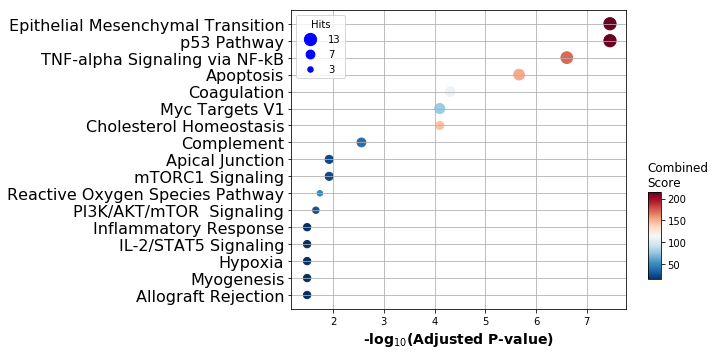

In [195]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [196]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

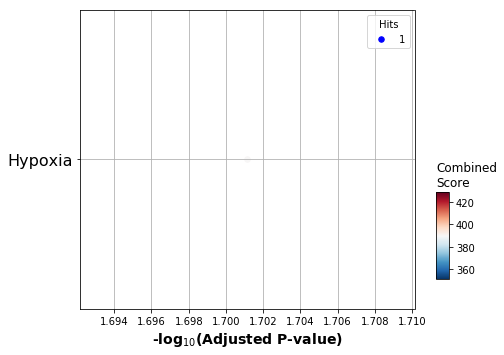

In [197]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Classical cells

In [196]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='classical'))]

In [197]:
psb_sel = psb[classes_sel.index]

In [198]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [199]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [200]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model)

In [201]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model, 'DataFrame')

## Visualize

In [202]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [203]:
print(len(genes_sel_up), len(genes_sel_down))

7 0


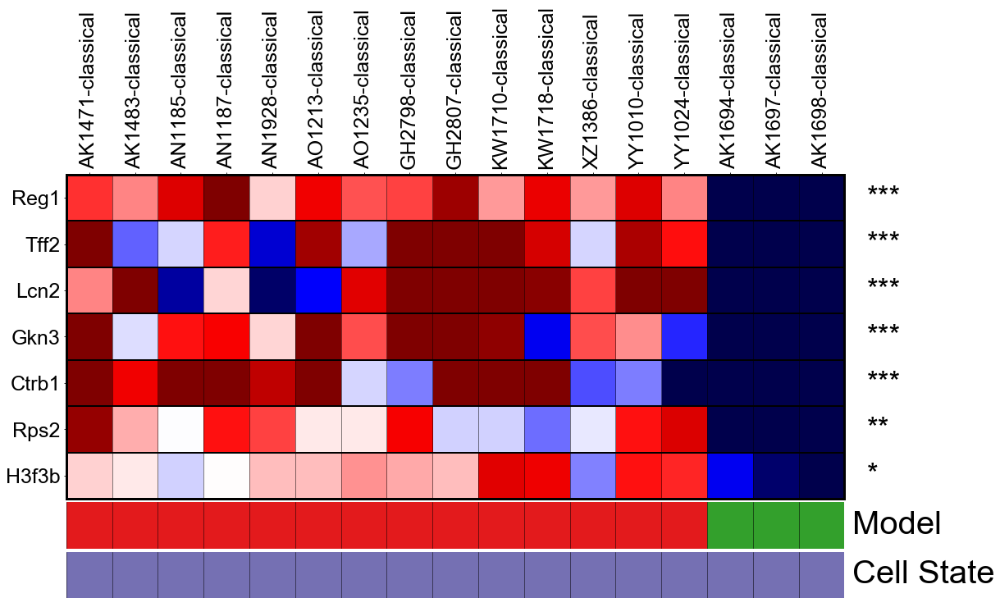

In [204]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_classical.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [207]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [208]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## EnrichR - genes down

In [209]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Basal cells

In [205]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='basal'))]

In [206]:
psb_sel = psb[classes_sel.index]

In [207]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [208]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [209]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model)

In [210]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model, 'DataFrame')

## Visualize

In [211]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [212]:
print(len(genes_sel_up), len(genes_sel_down))

14 1


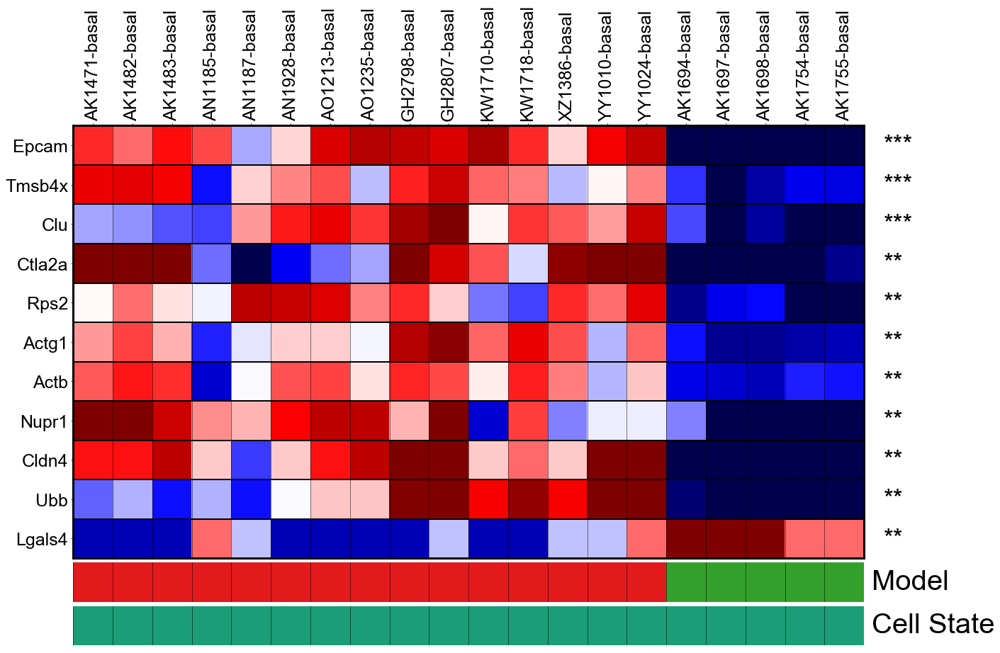

In [213]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_basal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [219]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

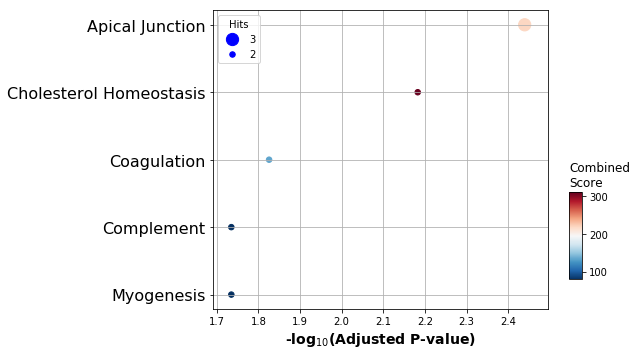

In [220]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [221]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [222]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## Mesenchymal cells

In [214]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='mesenchymal'))]

In [215]:
psb_sel = psb[classes_sel.index]

In [216]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [217]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [218]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model)

In [219]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model, 'DataFrame')

## Visualize

In [220]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [221]:
print(len(genes_sel_up), len(genes_sel_down))

5 0


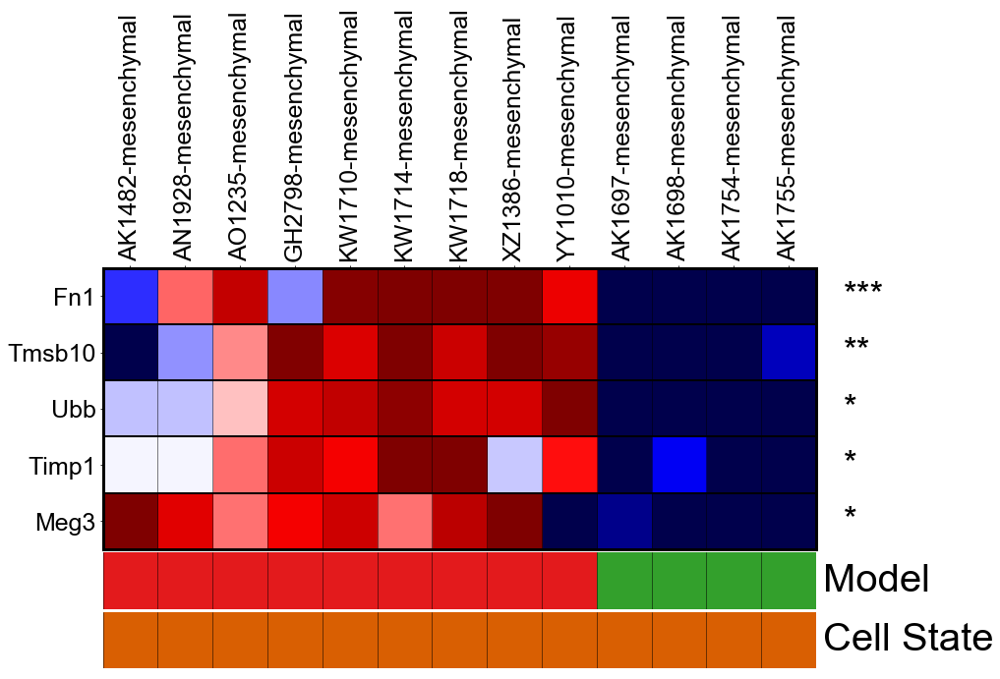

In [222]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_mesenchymal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [232]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

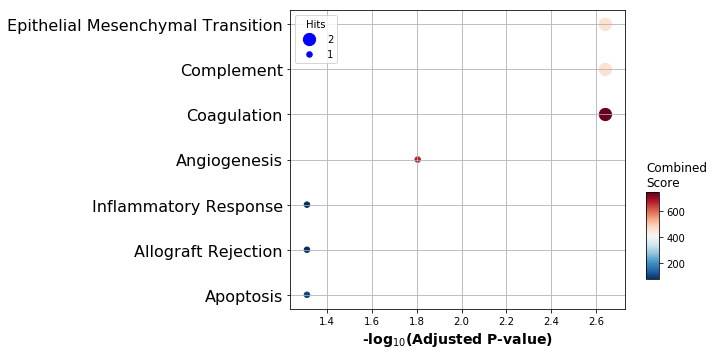

In [233]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [234]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

# DEGs: NSG_3D vs. autochthonous

In [223]:
model = 'NSG_3D'

## all cells

In [224]:
classes_sel = classes[classes['model'].isin(['autochthonous',model])]

In [225]:
psb_sel = psb[classes_sel.index]

In [226]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~population+model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [227]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [228]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model)

In [229]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model, 'DataFrame')

## Visualize

In [230]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [231]:
print(len(genes_sel_up), len(genes_sel_down))

14 9


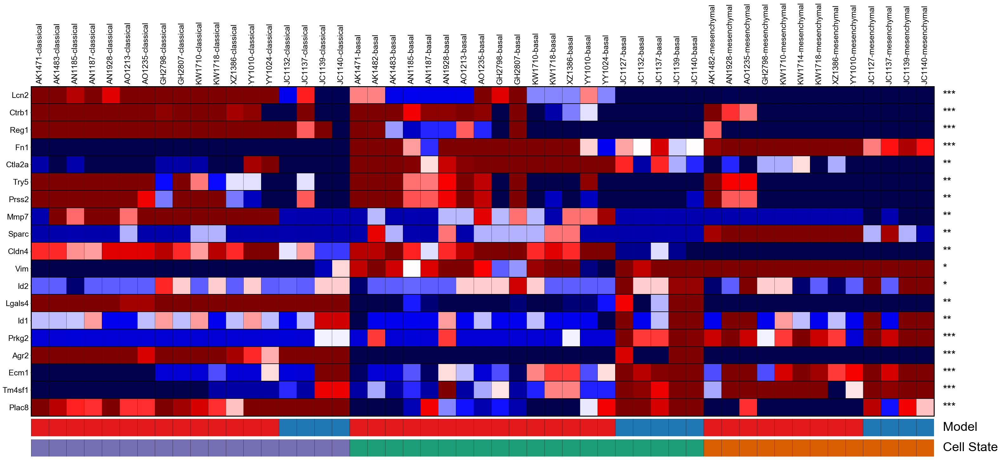

In [232]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_all.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [245]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

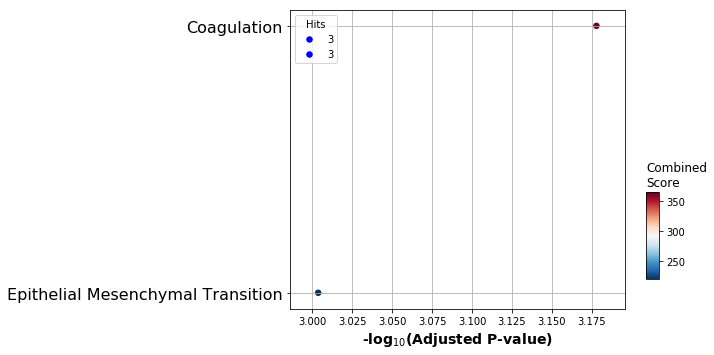

In [246]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [247]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

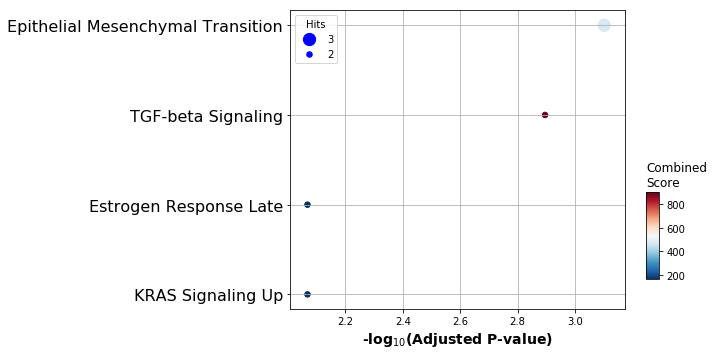

In [248]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Classical cells

In [233]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='classical'))]

In [234]:
psb_sel = psb[classes_sel.index]

In [235]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [236]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [237]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model)

In [238]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model, 'DataFrame')

## Visualize

In [239]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [240]:
print(len(genes_sel_up), len(genes_sel_down))

2 0


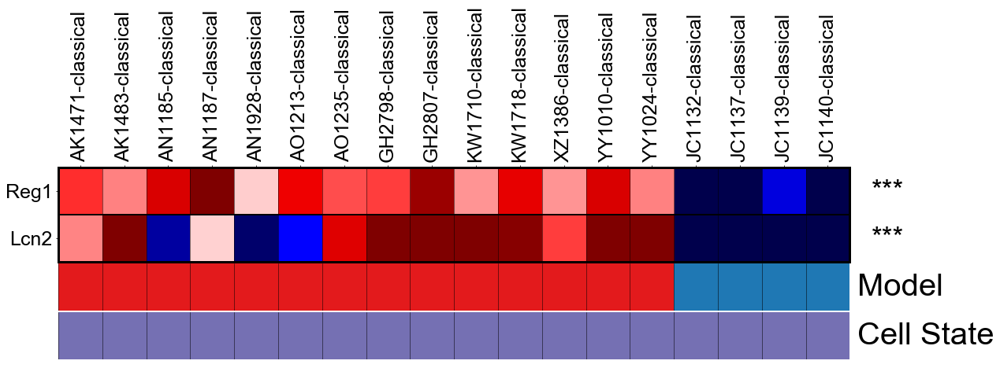

In [241]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_classical.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [258]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [259]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## EnrichR - genes down

In [260]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Basal cells

In [242]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='basal'))]

In [243]:
psb_sel = psb[classes_sel.index]

In [244]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [245]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [246]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model)

In [247]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model, 'DataFrame')

## Visualize

In [248]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [249]:
print(len(genes_sel_up), len(genes_sel_down))

4 6


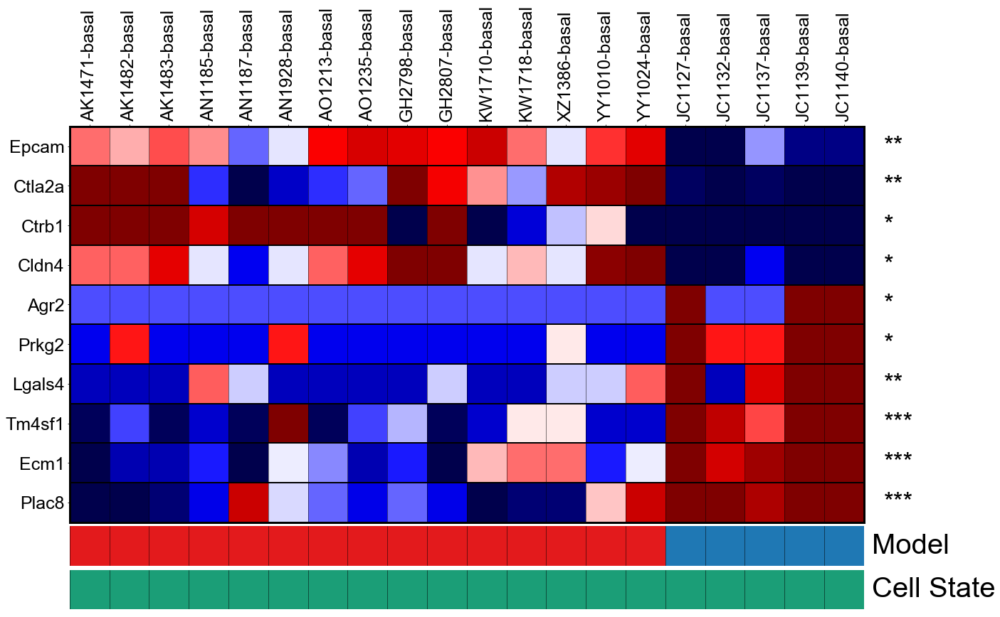

In [250]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_basal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [270]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

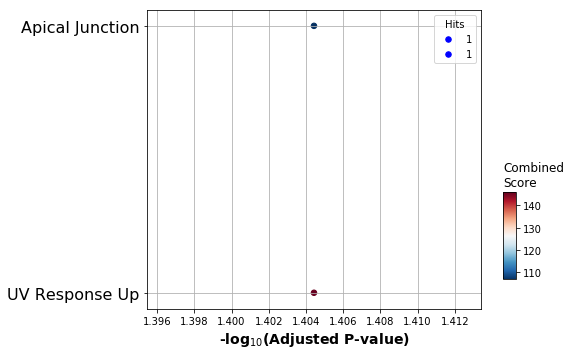

In [271]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [272]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [273]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## Mesenchymal cells

In [251]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='mesenchymal'))]

In [252]:
psb_sel = psb[classes_sel.index]

In [253]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [254]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [255]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model)

In [256]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model, 'DataFrame')

## Visualize

In [257]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [258]:
print(len(genes_sel_up), len(genes_sel_down))

2 0


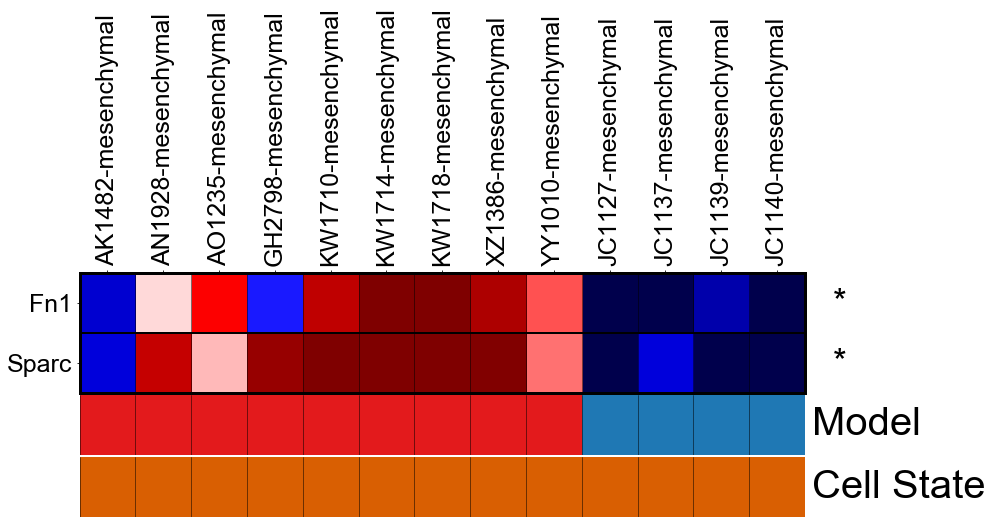

In [259]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_mesenchymal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [283]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

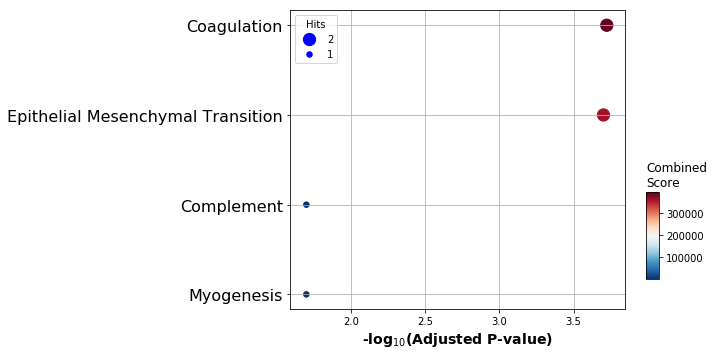

In [284]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [285]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

In [ ]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

# DEGs: NSG_fragment vs. autochthonous

In [260]:
model = 'NSG_fragment'

## all cells

In [261]:
classes_sel = classes[classes['model'].isin(['autochthonous',model])]

In [262]:
psb_sel = psb[classes_sel.index]

In [263]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~population+model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [264]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [265]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model)

In [266]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_all' % model, 'DataFrame')

## Visualize

In [267]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [268]:
print(len(genes_sel_up), len(genes_sel_down))

63 113


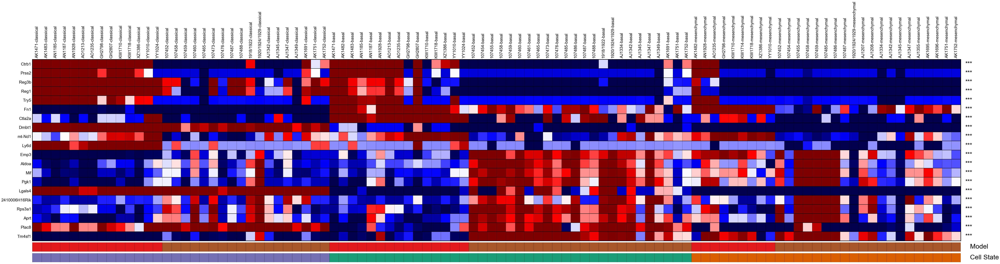

In [269]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_all.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [296]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

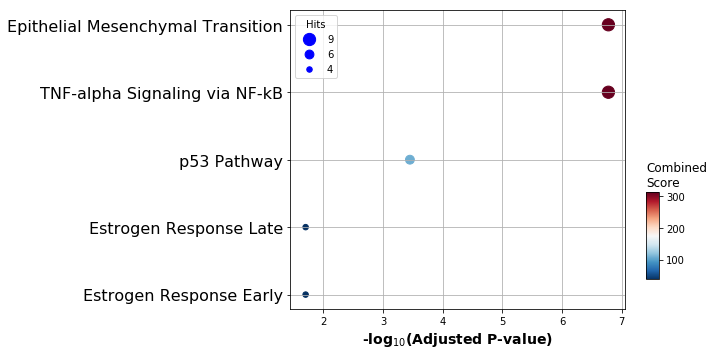

In [297]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [298]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

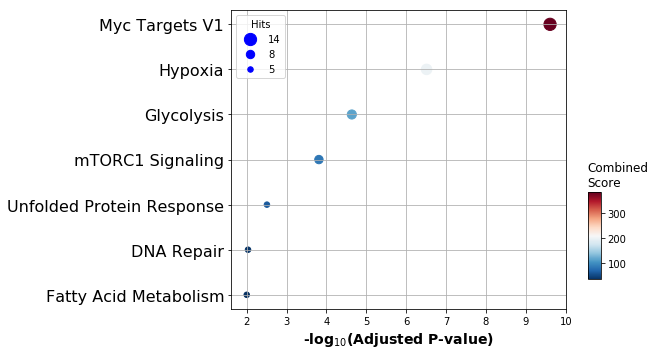

In [299]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Classical cells

In [270]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='classical'))]

In [271]:
psb_sel = psb[classes_sel.index]

In [272]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [273]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [274]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model)

In [275]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_classical' % model, 'DataFrame')

## Visualize

In [276]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [277]:
print(len(genes_sel_up), len(genes_sel_down))

17 2


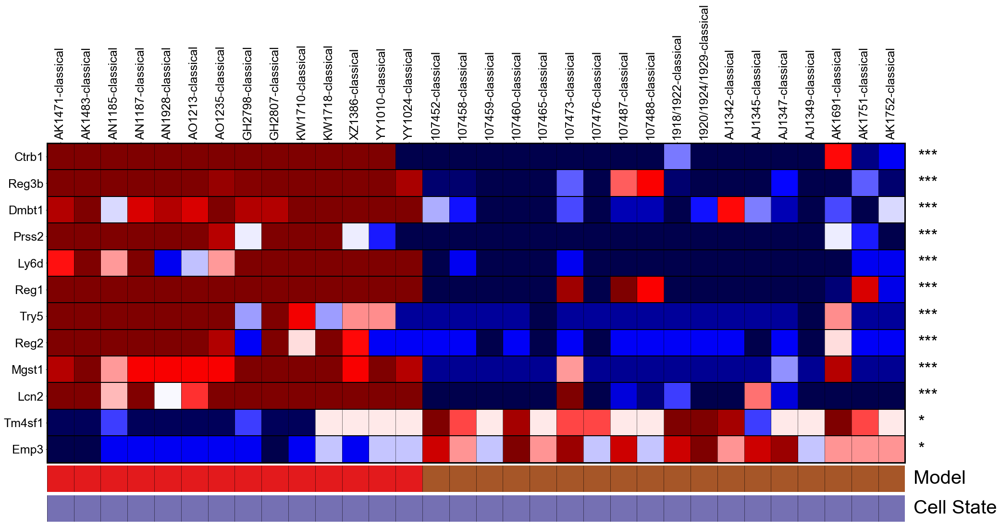

In [278]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_classical.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [309]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

In [310]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

'Warning: No enrich terms when cutoff = 0.05'

## EnrichR - genes down

In [311]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

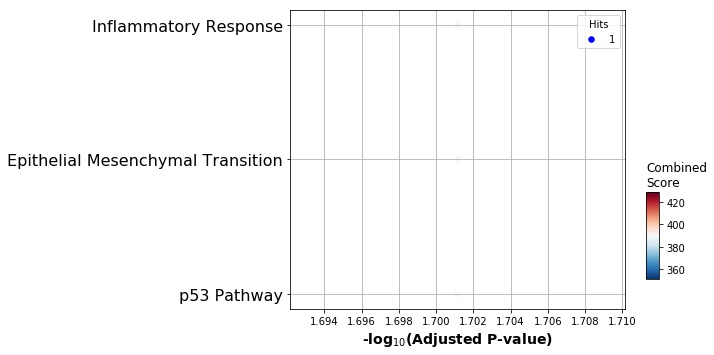

In [312]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Basal cells

In [279]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='basal'))]

In [280]:
psb_sel = psb[classes_sel.index]

In [281]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [282]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [283]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model)

In [284]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_basal' % model, 'DataFrame')

## Visualize

In [285]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [286]:
print(len(genes_sel_up), len(genes_sel_down))

23 135


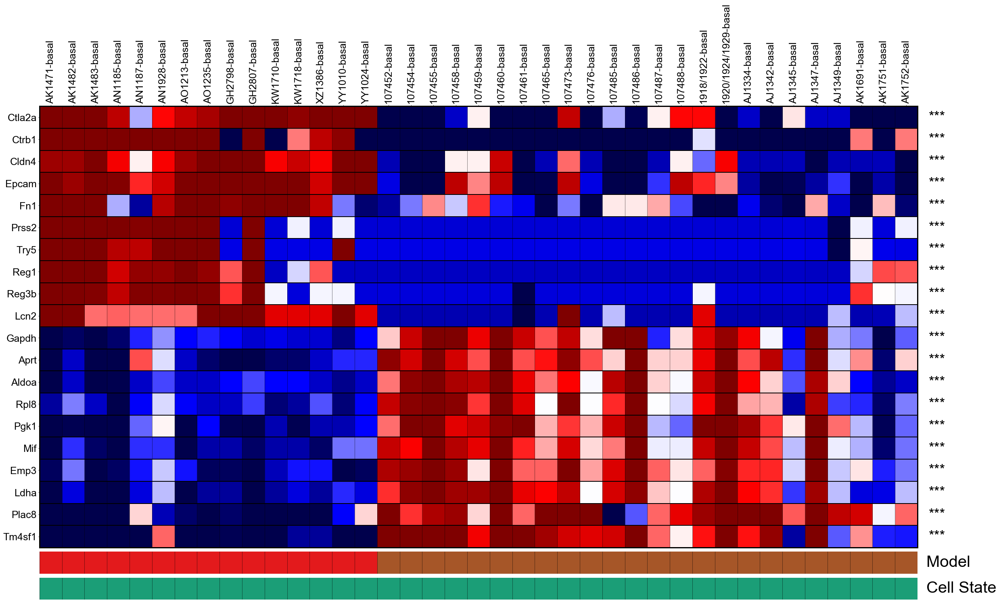

In [287]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_basal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [322]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

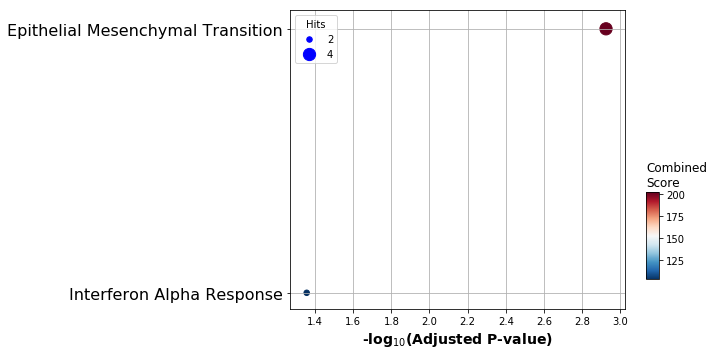

In [323]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [324]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

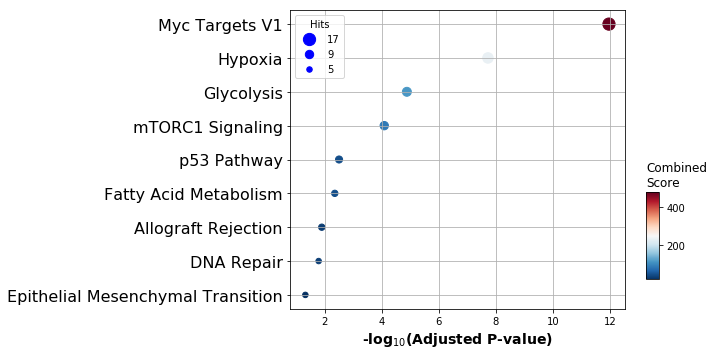

In [325]:
gp.plot.dotplot(enr_down.res2d, top_term=20)

## Mesenchymal cells

In [288]:
classes_sel = classes[(classes['model'].isin(['autochthonous',model])&(classes['population']=='mesenchymal'))]

In [289]:
psb_sel = psb[classes_sel.index]

In [290]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [291]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [292]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model)

In [293]:
res = load_from_txt(path_output, exp_id, 'DESeq2_aut_vs_%s_mesenchymal' % model, 'DataFrame')

## Visualize

In [294]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [295]:
print(len(genes_sel_up), len(genes_sel_down))

10 0


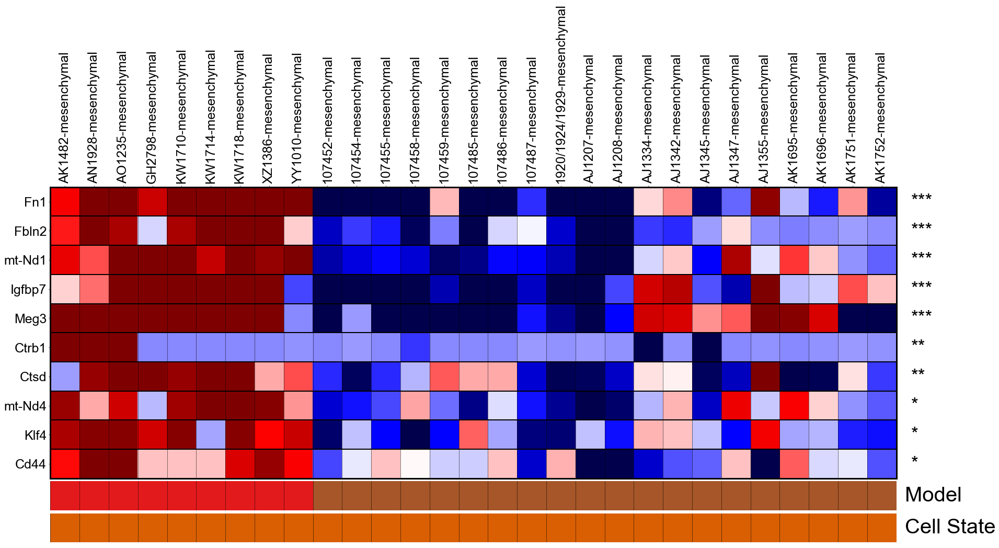

In [296]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1)
dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -1, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

figname = 'hm_deg_aut_vs_%s_mesenchymal.pdf' % model
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## EnrichR - genes up

In [335]:
enr_up = gp.enrichr(gene_list=list(genes_sel_up),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

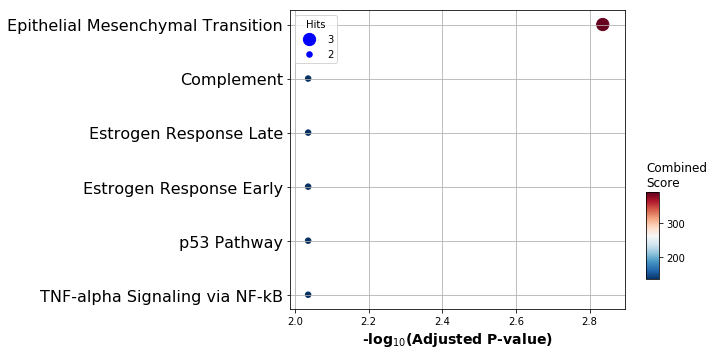

In [336]:
gp.plot.dotplot(enr_up.res2d, top_term=20)

## EnrichR - genes down

In [337]:
enr_down = gp.enrichr(gene_list=list(genes_sel_down),
                        gene_sets='MSigDB_Hallmark_2020',
                        organism='Mouse',
                        cutoff=0.01,
                        no_plot=True,)

Exception: Error analyzing gene list

# Comparison of cell states over all models

In [403]:
gr_order = []

for p in ['classical','basal','mesenchymal']: 
    for t in ['autochthonous','NSG_unsorted','NSG_TdTom-sorted','NSG_2D','NSG_3D','NSG_fragment']:
        gr_order += sorted(list(classes[(classes['model']==t)&(classes['population']==p)].index))

In [404]:
classes = classes.loc[gr_order]
psb = psb[gr_order]

## Classical cells

In [405]:
classes_sel = classes.copy()
classes_sel['population'][classes_sel['population']!='classical'] = 'other'

In [406]:
psb_sel = psb

In [407]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model+population)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [408]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [409]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_all_classical')

In [410]:
res = load_from_txt(path_output, exp_id, 'DESeq2_all_classical', 'DataFrame')

## Visualize

In [411]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [412]:
print(len(genes_sel_up), len(genes_sel_down))

591 186


Text(151.5, 0.5, 'Cell State')

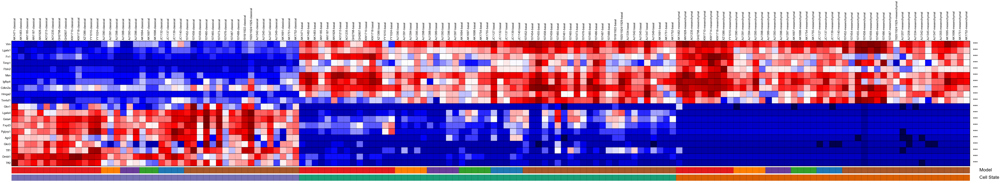

In [413]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1).apply(lambda x: x/np.max(x),axis=1)
#dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -0, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

In [414]:
genes_up_classical = genes_sel_down

## Basal cells

In [415]:
classes_sel = classes.copy()
classes_sel['population'][classes_sel['population']!='basal'] = 'other'

In [416]:
psb_sel = psb

In [417]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model+population)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [418]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [419]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_all_basal')

In [420]:
res = load_from_txt(path_output, exp_id, 'DESeq2_all_basal', 'DataFrame')

## Visualize

In [421]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [422]:
print(len(genes_sel_up), len(genes_sel_down))

43 163


Text(151.5, 0.5, 'Cell State')

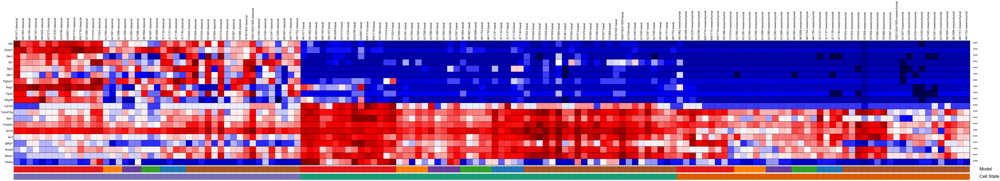

In [423]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1).apply(lambda x: x/np.max(x),axis=1)
#dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -0, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

In [424]:
genes_up_basal = genes_sel_down

## Mesenchymal cells

In [425]:
classes_sel = classes.copy()
classes_sel['population'][classes_sel['population']!='mesenchymal'] = 'other'

In [426]:
psb_sel = psb

In [427]:
%%R -i psb_sel -i classes_sel -o cnts_out -o res_out

dds <- DESeqDataSetFromMatrix(countData = psb_sel, colData = classes_sel, design = ~model+population)
dds <- DESeq(dds)
cnts <- counts(dds, normalized=TRUE)
res <- results(dds)
cnts_out <- as.data.frame(cnts)
res_out <- as.data.frame(res)

In [428]:
res_out['padj'] = stats.p_adjust(FloatVector(res_out['pvalue']), method = 'BH')

## Checkpoint

In [429]:
#save_to_txt(res_out, path_output, exp_id, 'DESeq2_all_mesenchymal')

In [430]:
res = load_from_txt(path_output, exp_id, 'DESeq2_all_mesenchymal', 'DataFrame')

## Visualize

In [431]:
genes_sel_up = res[(res['log2FoldChange']>0.25)&(res['padj']<0.05)]['padj'].sort_values().index
genes_sel_down = res[(res['log2FoldChange']<-0.25)&(res['padj']<0.05)]['padj'].sort_values().index

In [432]:
print(len(genes_sel_up), len(genes_sel_down))

161 122


Text(151.5, 0.5, 'Cell State')

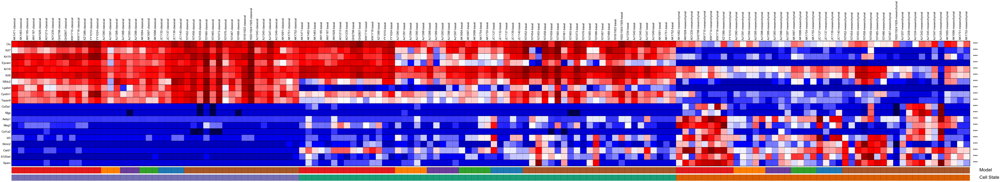

In [433]:
features = list(genes_sel_up[0:10]) + list(genes_sel_down[0:10][::-1])
groups = classes_sel.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1).apply(lambda x: x/np.max(x),axis=1)
#dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+2.5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),1,1])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -0, vmax = 1, cmap = plt.cm.seismic, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 25, family = 'Arial')

#plot group names

ax.set_xticks(range(len(groups)))
ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')

#models
            
ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Model', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.01, 0.5, 'Cell State', family = 'Arial', fontsize = 40, va = 'center', ha = 'left')

In [434]:
genes_up_mesenchymal = genes_sel_down

## Complete visualization

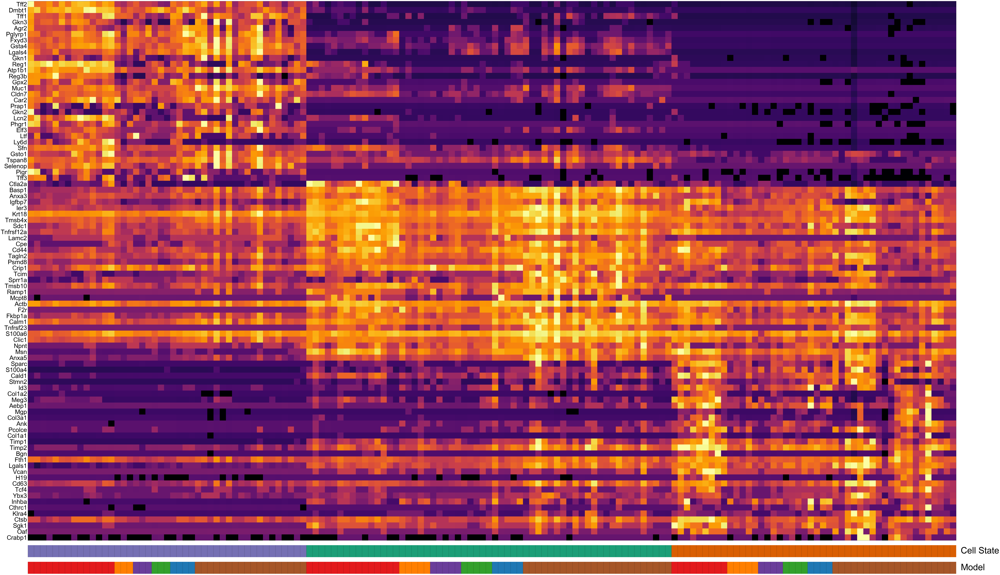

In [435]:
features = list(genes_up_classical[0:30]) + list(genes_up_basal[0:30]) + list(genes_up_mesenchymal[0:30])
groups = classes.index
dat = cnts_out[groups]
dat = np.log2(dat.loc[[f for f in features if f in dat.index]]+1).apply(lambda x: x/np.max(x),axis=1)
#dat = dat.apply(lambda x: x - x.mean(), axis=1)
padj = res['padj']
thr1 = 0.1
thr2 = 0.01
thr3 = 0.001
    
#initialize figure

height = 1 * len(features)+5
width = 1 * len(groups)

plt.figure(facecolor = 'w', figsize = (width, height))
gs = plt.GridSpec(3, 1, hspace=0.025, height_ratios=[len(features),2,2])

ax = plt.subplot(gs[0])
    
#plot data

ax.imshow(dat.astype(float), vmin = -0, vmax = 1, cmap = plt.cm.inferno, aspect = 'auto')

# plot gene names

ax.set_yticks(range(len(features)))
ax.set_yticklabels([i.split('_')[0] for i in features], fontsize = 56, family = 'Arial')

#plot group names

ax.set_xticks([])
#ax.set_xticklabels([i for i in groups], fontsize = 25, family = 'Arial', rotation = 'vertical')
ax.xaxis.set_ticks_position('top')

# plot grid
"""
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color('k')
    
for y in range(len(features)):
    ax.axhline(y+0.5, linewidth = 2, color = 'k')

for x in range(len(groups)):
    ax.axvline(x+0.5, linewidth = 0.5, color = 'k')

for i, f in enumerate(features):
    if f in padj.index:
        if padj[f] < thr3: ax.text(len(groups), i, '***', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr2: ax.text(len(groups), i, '**', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
        elif padj[f] < thr1: ax.text(len(groups), i, '*', family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
"""
#models
            
ax = plt.subplot(gs[2])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['model']):
    ax.axvspan(i,i+1, color=cmap_tumor_sel[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.005, 0.5, 'Model', family = 'Arial', fontsize = 80, va = 'center', ha = 'left')

#populations

ax = plt.subplot(gs[1])
ax.set_xlim(0,len(groups))

for i,p in enumerate(classes.loc[groups]['population']):
    ax.axvspan(i,i+1, color=cmap_population[p])
    ax.axvline(i, linewidth = 0.5, color = 'k')
    
clean_axis(ax)

ax.text(len(groups)*1.005, 0.5, 'Cell State', family = 'Arial', fontsize = 80, va = 'center', ha = 'left')

figname = 'hm_deg_all_cell_states.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)